# 21 cm × Galaxy Cross-Correlation: HERA × Euclid (Lightcone)
### Simulating cross-power spectra with 21cmFASTv4 (Davies et al. 2025)

This notebook uses the discrete source model introduced in
[Davies, Mesinger & Murray (2025)](https://arxiv.org/abs/2504.17254) to:

1. Run a **21cmFASTv4** lightcone simulation with discrete galaxy sources
2. Apply a **Euclid-like** photometric selection to the galaxy catalogue
3. Compute the **2D cylindrical cross-power spectrum** $P_{21\times\mathrm{gal}}(k_\perp, k_\parallel)$
4. Estimate the **SNR** for a HERA × Euclid cross-correlation detection

**Key difference from the coeval version:** Here a full **lightcone** is generated
via `RectilinearLightconer` + `run_lightcone`, so the line-of-sight axis spans a
redshift range rather than a single snapshot. The non-cubic box dimensions
$(N_\perp \times N_\perp \times N_z)$ are handled throughout.

---

**Requirements:**
- `21cmFAST >= 4.0.0` — install via `pip install 21cmFAST` (requires C compiler, FFTW3, GSL)
- `numpy`, `matplotlib`, `scipy`, `astropy`

**References:**
- Davies, Mesinger & Murray (2025) — [arXiv:2504.17254](https://arxiv.org/abs/2504.17254) — 21cmFASTv4 discrete source model
- Gagnon-Hartman, Davies & Mesinger (2025) — [arXiv:2502.20447](https://arxiv.org/abs/2502.20447) — galaxy–21cm cross-correlation detection forecasts
- La Plante et al. (2023) — [arXiv:2205.09770](https://arxiv.org/abs/2205.09770) — uncertainty formalism
- Euclid Collaboration (2022) — [arXiv:2108.01201](https://arxiv.org/abs/2108.01201) — Euclid survey specifications

## Imports and setup

In [8]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import quad
from scipy.ndimage import generic_filter
import warnings

# Project-wide cosmological conversions (single source of truth for the
# Madau & Dickinson 2014 UV calibration, kappa_UV = 1.15e-28).
from src.conversions import sfr_to_Luv

warnings.filterwarnings("ignore")

# ── Check whether 21cmFAST is installed ──────────────────────────────────────
try:
    import py21cmfast as p21c
    from astropy.cosmology import Planck18
    import astropy.units as u
    HAS_21CMFAST = True
    print(f"21cmFAST version: {p21c.__version__}")
except ImportError:
    HAS_21CMFAST = False
    print("21cmFAST not installed — will use synthetic fields for demonstration.")
    print("Install with:  pip install 21cmFAST")

# ── Matplotlib defaults ──────────────────────────────────────────────────────
plt.rcParams.update({
    "figure.dpi":      300,
    "font.size":       12,
    "axes.labelsize":  13,
    "legend.fontsize": 10,
    "axes.grid":       False,
})

21cmFAST version: 4.1.1


---
## ★ CONFIGURATION — edit only this cell ★

All user-adjustable parameters are collected here. Every subsequent cell reads
from these variables; no other cell needs to be edited for a standard run.

---

In [9]:
# ===========================================================================
#  ★ CONFIGURATION — ALL USER-ADJUSTABLE PARAMETERS ★
#  Edit values in this cell only. All other cells read from here.
# ===========================================================================

# ---------------------------------------------------------------------------
#  Simulation grid
# ---------------------------------------------------------------------------
HII_DIM = 128        # cells per side (low-res grid)
BOX_LEN = 256.0      # comoving box side length [Mpc]
DIM     = 3 * HII_DIM  # high-res grid for initial conditions

# ---------------------------------------------------------------------------
#  Lightcone redshift range
# ---------------------------------------------------------------------------
z_min = 6.5          # nearest redshift (low-z end of lightcone)
z_max = 7.5          # farthest redshift (high-z end)

# ---------------------------------------------------------------------------
#  Euclid-like survey parameters
# ---------------------------------------------------------------------------
M_UV_faint          = -18.0  # faint-end UV magnitude cut (Euclid depth)
M_UV_bright         = -22.66 # bright-end UV magnitude cut
photoz_uncertainty  = 0.059  # sigma_z photometric redshift error
mean_galaxy_density = 3e-3   # n_bar  [h^3 Mpc^-3]

# ---------------------------------------------------------------------------
#  Galaxy bias
# ---------------------------------------------------------------------------
galaxy_bias = 8              # linear bias b (typical for high-z LBGs)

# ---------------------------------------------------------------------------
#  Cosmological parameters (Planck 2018)
# ---------------------------------------------------------------------------
OMEGA_M_0       = 0.315      # matter density parameter
HUBBLE_CONSTANT = 67.36      # H_0  [km s^-1 Mpc^-1]

# ---------------------------------------------------------------------------
#  Physical constants
# ---------------------------------------------------------------------------
SPEED_OF_LIGHT_KMS = 3e5         # c  [km s^-1]
SPEED_OF_LIGHT_MPS = 3e8         # c  [m s^-1]
F_21_MHZ           = 1420.405    # 21cm rest frequency  [MHz]
F_21_HZ            = F_21_MHZ * 1e6

# ---------------------------------------------------------------------------
#  HERA instrument
# ---------------------------------------------------------------------------
HERA_DISH_DIAMETER = 14.0        # dish diameter  [m]
integration_time   = 1000 * 3600 # total integration  [s]  (1000 h)
bandwidth          = 8e6         # per-band bandwidth  [Hz]  (8 MHz)

# ---------------------------------------------------------------------------
#  Foreground wedge
# ---------------------------------------------------------------------------
wedge_buffer = 0.02              # safety margin beyond horizon line  [Mpc^-1]

# ---------------------------------------------------------------------------
#  Power spectrum binning
# ---------------------------------------------------------------------------
n_bins_perp     = 20
n_bins_parallel = 20

# ===========================================================================
#  End of configuration
# ===========================================================================

## 1  Derived quantities

Compute the lightcone geometry from the configuration above: the comoving
line-of-sight extent $L_{\rm LOS}$, the number of LOS slices $N_z$ (matched
to the transverse cell size), and the redshift array for each slice.

In [10]:
# ── Hubble parameter (used throughout) ───────────────────────────────────────
def hubble_parameter(z):
    """H(z) for flat ΛCDM  [km s⁻¹ Mpc⁻¹]."""
    return HUBBLE_CONSTANT * np.sqrt(OMEGA_M_0 * (1 + z)**3 + (1 - OMEGA_M_0))


# ── Comoving distances to lightcone endpoints (using Planck18 for precision) ─
if HAS_21CMFAST:
    D_min = Planck18.comoving_distance(z_min).to(u.Mpc).value
    D_max = Planck18.comoving_distance(z_max).to(u.Mpc).value
else:
    D_min, _ = quad(lambda z_: SPEED_OF_LIGHT_KMS / hubble_parameter(z_), 0, z_min)
    D_max, _ = quad(lambda z_: SPEED_OF_LIGHT_KMS / hubble_parameter(z_), 0, z_max)

L_los     = D_max - D_min   # comoving LOS extent  [Mpc]
cell_size = BOX_LEN / HII_DIM

# ── Reference redshift (centre of lightcone, used for noise / wedge) ─────────
z_obs = 0.5 * (z_min + z_max)

# ── Number of LOS slices ──────────────────────────────────────────────────────
# Normally matched to the transverse cell size; override via minimum_los_slices
# for test runs where the z-range implies fewer natural slices.
minimum_los_slices = 100
N_z = max(int(round(L_los / cell_size)), minimum_los_slices)

# Redshift and distance for each LOS slice (low-z → high-z)
lc_redshifts = np.linspace(z_min, z_max, N_z)

# ── Node redshifts for 21cmFAST (coeval snapshots driving the physics) ────────
# Use ~10 nodes per unit redshift for good accuracy
n_nodes      = max(int(round(10 * (z_max - z_min))), 5)
node_redshifts = np.linspace(z_max, z_min, n_nodes)   # high-z → low-z

# ── Summary ──────────────────────────────────────────────────────────────────
print(f"Box         : {BOX_LEN:.0f} Mpc,  {HII_DIM}³ cells  →  cell size = {cell_size:.1f} Mpc")
print(f"Lightcone   : z = {z_min} → {z_max}   (reference z_obs = {z_obs})")
print(f"LOS extent  : {L_los:.1f} Mpc  →  N_z = {N_z} slices")
print(f"Box shape   : ({HII_DIM}, {HII_DIM}, {N_z})")
print(f"Node redshifts: {n_nodes} nodes from z={z_max} to z={z_min}")
print(f"Euclid      : M_UV < {M_UV_faint},  σ_z = {photoz_uncertainty}")

Box         : 256 Mpc,  128³ cells  →  cell size = 2.0 Mpc
Lightcone   : z = 6.5 → 7.5   (reference z_obs = 7.0)
LOS extent  : 350.8 Mpc  →  N_z = 175 slices
Box shape   : (128, 128, 175)
Node redshifts: 10 nodes from z=7.5 to z=6.5
Euclid      : M_UV < -18.0,  σ_z = 0.059


## 2  Run the 21cmFASTv4 lightcone simulation

The v4 API uses `RectilinearLightconer` to specify the LOS slice redshifts and
the quantities to store, then `run_lightcone` to execute the simulation.

Compared to a coeval run, the lightcone:
- Evolves the physics across the full redshift range `[z_min, z_max]`
- Stores one coeval slice per LOS cell rather than a single snapshot
- Produces a rectangular `(HII_DIM, HII_DIM, N_z)` output volume

Available lightcone quantities (from `LightCone.get_fields`):
`brightness_temp`, `density`, `neutral_fraction`, `halo_sfr`, `n_ion`,
`kinetic_temperature`, `z_reion`, `mean_free_path`, …

In [11]:
if HAS_21CMFAST:
    print("Running 21cmFAST lightcone simulation …")
    print(f"  z = {z_min} → {z_max},  N_z = {N_z} slices")

    inputs = p21c.InputParameters.from_template(
        ["simple"],
        random_seed=42,
    )

    inputs = inputs.clone(
        node_redshifts=node_redshifts,
        simulation_options={
            "HII_DIM": HII_DIM,
            "BOX_LEN": BOX_LEN,
            "DIM":     DIM,
        },
        matter_options={
            "USE_INTERPOLATION_TABLES": "hmf-interpolation",
        },
    )

    lightconer = p21c.RectilinearLightconer(
        lc_redshifts=lc_redshifts,
        quantities=("brightness_temp", "density", "neutral_fraction", "halo_sfr"),
    )

    lightcone = p21c.run_lightcone(
        lightconer=lightconer,
        inputs=inputs,
        include_dvdr_in_tau21=False,
        apply_rsds=False,
    )
    brightness_temp_field = lightcone.lightcones["brightness_temp"]   # (HII_DIM, HII_DIM, N_z)
    density_field         = lightcone.lightcones["density"]
    neutral_fraction      = lightcone.lightcones["neutral_fraction"]

    # Update LOS geometry from the actual simulation output
    N_z   = lightcone.n_slices
    L_los = lightcone.lightcone_dimensions[2]   # actual LOS comoving size  [Mpc]
    lc_dist_Mpc = lightcone.lightcone_distances.to(u.Mpc).value   # (N_z,) array

    print(f"  Lightcone shape : {lightcone.shape}")
    print(f"  LOS extent      : {L_los:.1f} Mpc")
    print(f"  <x_HI>          : {np.mean(neutral_fraction):.3f}")
    print(
        f"  dT_b            : "
        f"[{brightness_temp_field.min():.1f}, "
        f"{brightness_temp_field.max():.1f}] mK"
    )

else:
    # ==================================================================
    #  Synthetic lightcone fallback (21cmFAST not installed)
    # ==================================================================
    print("Generating synthetic lightcone fields (21cmFAST not available) …")
    np.random.seed(42)

    N = HII_DIM
    kx     = np.fft.fftfreq(N,   d=cell_size) * 2 * np.pi
    ky     = np.fft.fftfreq(N,   d=cell_size) * 2 * np.pi
    kz_los = np.fft.fftfreq(N_z, d=cell_size) * 2 * np.pi
    KX, KY, KZ = np.meshgrid(kx, ky, kz_los, indexing="ij")
    K_magnitude = np.sqrt(KX**2 + KY**2 + KZ**2)
    K_magnitude[0, 0, 0] = 1.0

    # Matter overdensity from P(k) ∝ k^−2
    ps_amplitude = K_magnitude**(-2)
    ps_amplitude[0, 0, 0] = 0.0
    random_phases = (
        np.random.standard_normal((N, N, N_z))
        + 1j * np.random.standard_normal((N, N, N_z))
    )
    density_field = np.fft.ifftn(np.sqrt(ps_amplitude / 2) * random_phases).real
    density_field = (density_field - density_field.mean()) / density_field.std() * 0.5

    # Neutral fraction via inside-out reionisation
    k_bubble = 2 * np.pi / 10.0
    smoothed = np.fft.ifftn(
        np.fft.fftn(density_field) * np.exp(-0.5 * K_magnitude**2 / k_bubble**2)
    ).real
    neutral_fraction = (smoothed < np.percentile(smoothed, 50)).astype(float)

    # Brightness temperature with redshift evolution along LOS
    T0_per_slice = 27.0 * np.sqrt((1 + lc_redshifts) / 10.0)   # (N_z,)
    brightness_temp_field = (
        T0_per_slice[np.newaxis, np.newaxis, :]
        * neutral_fraction * (1.0 + density_field)
    )

    lc_dist_Mpc = D_min + (D_max - D_min) * np.linspace(0, 1, N_z)

    print(f"  Shape  : {brightness_temp_field.shape}")
    print(f"  ⟨x_HI⟩ : {np.mean(neutral_fraction):.3f}")
    print(f"  δT_b   : [{brightness_temp_field.min():.1f}, {brightness_temp_field.max():.1f}] mK")

Running 21cmFAST lightcone simulation …
  z = 6.5 → 7.5,  N_z = 175 slices
  Lightcone shape : (128, 128, 175)
  LOS extent      : 350.0 Mpc
  <x_HI>          : 0.154
  dT_b            : [0.0, 24.9] mK


In [12]:
# ==========================================================================
# Extract actual 21cmFASTv4 halo catalogue at z_obs
# ==========================================================================


print(f"Extracting halo catalogue at z = {z_obs} ...")

# 1. Compute initial conditions using the same inputs as the lightcone
initial_conditions = p21c.compute_initial_conditions(
    inputs=inputs,
)

# 2. Draw the Lagrangian halo catalogue at z_obs
halo_catalog = p21c.determine_halo_catalog(
    redshift=z_obs,
    inputs=inputs,
    initial_conditions=initial_conditions,
)

# 3. Perturb halos to Eulerian positions at z_obs
perturbed_halos = p21c.perturb_halo_catalog(
    inputs=inputs,
    initial_conditions=initial_conditions,
    halo_catalog=halo_catalog,
)

# 4. Pull useful arrays
halo_masses = perturbed_halos.halo_masses
halo_coords = perturbed_halos.halo_coords
stellar_masses = perturbed_halos.stellar_masses
halo_sfr = perturbed_halos.sfr

print(f"Number of halos: {perturbed_halos.n_halos}")
# print(f"Halo mass range: {halo_masses.min():.3e} - {halo_masses.max():.3e} Msun")
# print(f"Stellar mass range: {stellar_masses.min():.3e} - {stellar_masses.max():.3e} Msun")
# print(f"SFR range: {halo_sfr.min():.3e} - {halo_sfr.max():.3e} Msun/yr")

Extracting halo catalogue at z = 7.0 ...
Number of halos: 114291212


Perturbed halo catalogue attributes:
['fesc_sfr', 'halo_coords', 'halo_masses', 'n_halos', 'sfr', 'sfr_mini', 'stellar_masses']

Catalogue diagnostics:
halo_coords shape = (114291212, 3), dtype = float32
halo_masses shape = (114291212,), dtype = float32
N_halos = 114,291,212
coord min/max = 0.000, 256.000
mass min/max = 1.000e+08, 1.767e+12 Msun
Interpreting halo coordinates as Mpc coordinates.


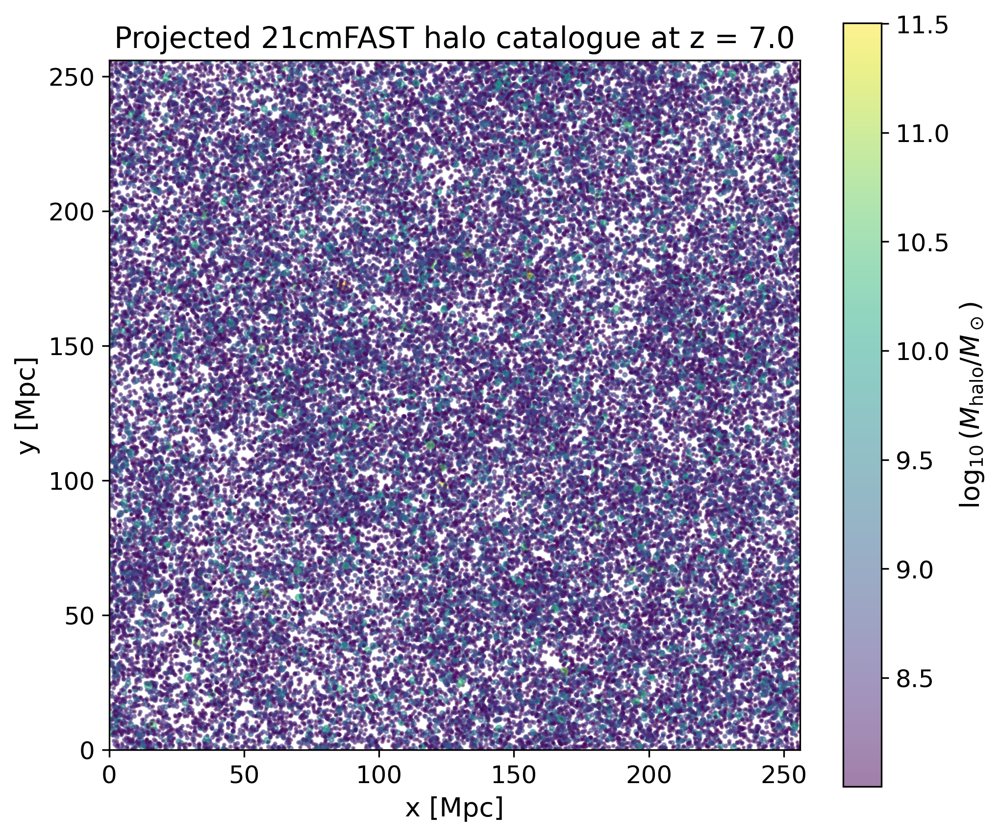

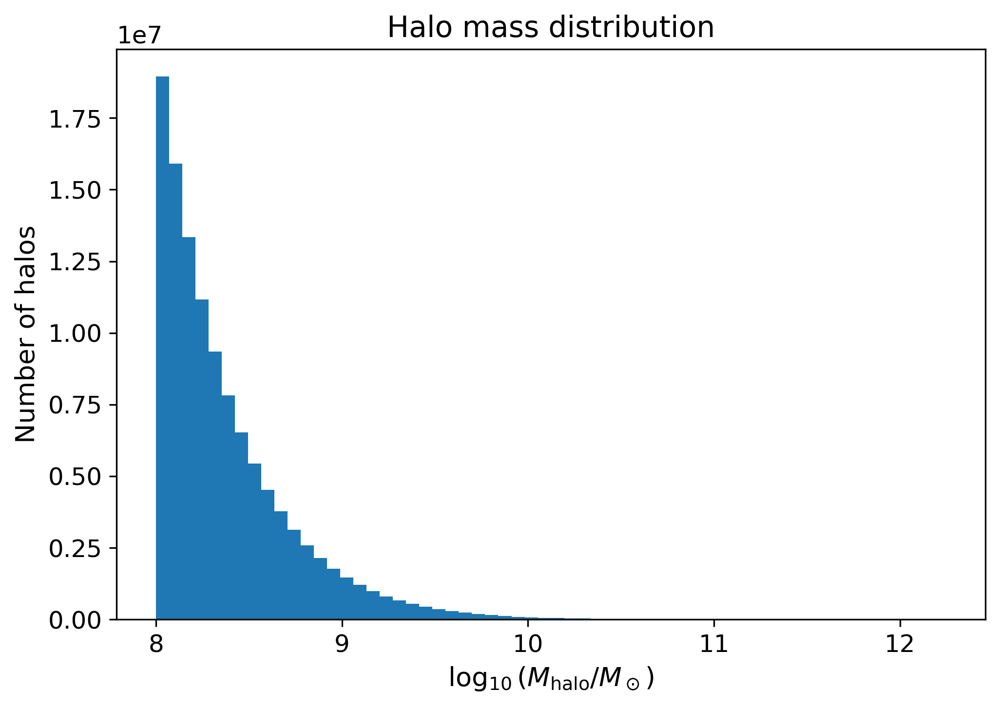


Halos in plotted slice = 3,411,722


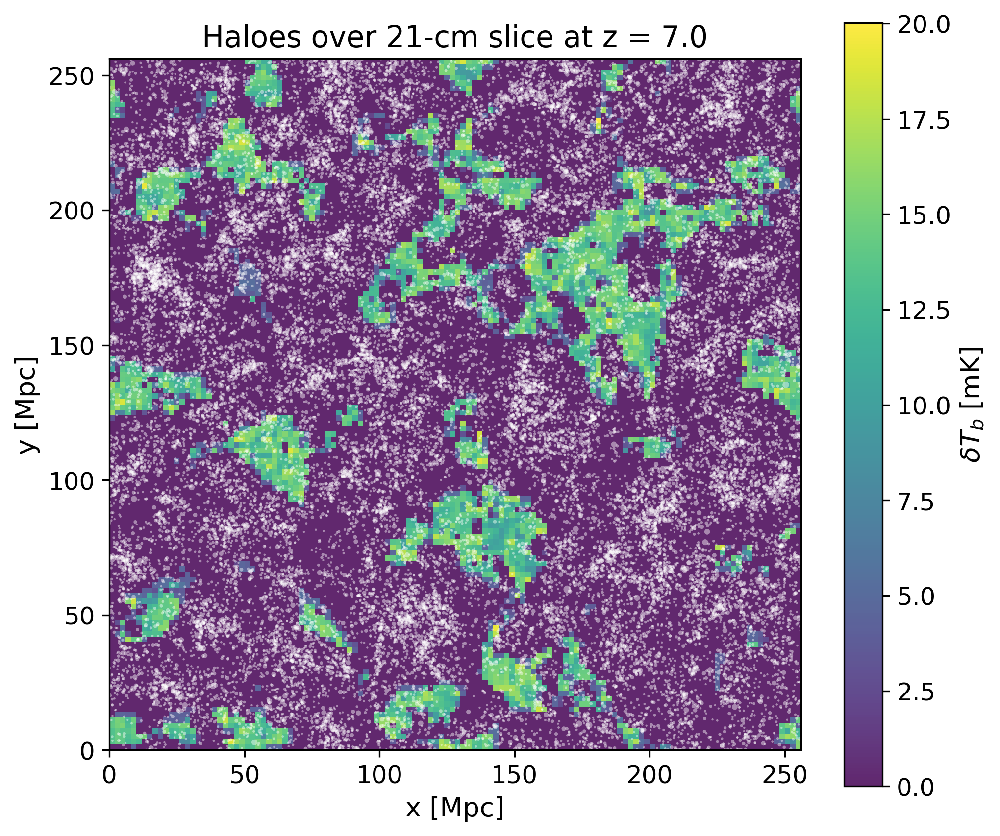

In [13]:
# ==========================================================================
# Visualise the 21cmFASTv4 halo catalogue safely
# ==========================================================================


# --------------------------------------------------------------------------
# 1. Inspect available fields
# --------------------------------------------------------------------------

print("Perturbed halo catalogue attributes:")
print([
    a for a in dir(perturbed_halos)
    if "halo" in a.lower() or "mass" in a.lower() or "sfr" in a.lower()
])

# --------------------------------------------------------------------------
# 2. Convert 21cmFAST Array objects to NumPy arrays
# --------------------------------------------------------------------------

halo_coords = np.asarray(perturbed_halos.halo_coords.value)
halo_masses = np.asarray(perturbed_halos.halo_masses.value)

print("\nCatalogue diagnostics:")
print(f"halo_coords shape = {halo_coords.shape}, dtype = {halo_coords.dtype}")
print(f"halo_masses shape = {halo_masses.shape}, dtype = {halo_masses.dtype}")
print(f"N_halos = {halo_coords.shape[0]:,}")
print(f"coord min/max = {halo_coords.min():.3f}, {halo_coords.max():.3f}")
print(f"mass min/max = {halo_masses.min():.3e}, {halo_masses.max():.3e} Msun")

# --------------------------------------------------------------------------
# 3. Subsample for plotting
# --------------------------------------------------------------------------

max_points = 50_000
rng = np.random.default_rng(42)

N_halos = halo_coords.shape[0]
plot_idx = rng.choice(
    N_halos,
    size=min(max_points, N_halos),
    replace=False,
)

halo_coords_plot = halo_coords[plot_idx]
halo_masses_plot = halo_masses[plot_idx]

# Coordinates look like grid coordinates if max ~ HII_DIM
if halo_coords.max() <= HII_DIM + 1:
    print("Interpreting halo coordinates as grid coordinates.")
    halo_pos_mpc = halo_coords_plot * (BOX_LEN / HII_DIM)
else:
    print("Interpreting halo coordinates as Mpc coordinates.")
    halo_pos_mpc = halo_coords_plot

x = halo_pos_mpc[:, 0]
y = halo_pos_mpc[:, 1]
z = halo_pos_mpc[:, 2]
m = halo_masses_plot

# --------------------------------------------------------------------------
# 4. Projected halo positions
# --------------------------------------------------------------------------

plt.figure(figsize=(7, 6))

plt.scatter(
    x,
    y,
    s=np.clip((np.log10(m) - 7.0)**2, 1, 30),
    c=np.log10(m),
    alpha=0.5,
)

plt.colorbar(label=r"$\log_{10}(M_{\rm halo}/M_\odot)$")
plt.xlabel("x [Mpc]")
plt.ylabel("y [Mpc]")
plt.title(f"Projected 21cmFAST halo catalogue at z = {z_obs}")
plt.xlim(0, BOX_LEN)
plt.ylim(0, BOX_LEN)
plt.gca().set_aspect("equal")
plt.tight_layout()
plt.show()

# --------------------------------------------------------------------------
# 5. Halo mass distribution
# --------------------------------------------------------------------------

plt.figure(figsize=(7, 5))

plt.hist(
    np.log10(halo_masses[halo_masses > 0]),
    bins=60,
)

plt.xlabel(r"$\log_{10}(M_{\rm halo}/M_\odot)$")
plt.ylabel("Number of halos")
plt.title("Halo mass distribution")
plt.tight_layout()
plt.show()

# --------------------------------------------------------------------------
# 6. Halos in a thin slice over 21-cm brightness temperature
# --------------------------------------------------------------------------

slice_index = HII_DIM // 2
cell_size = BOX_LEN / HII_DIM
slice_z_mpc = slice_index * cell_size
slice_width_cells = 2
slice_width_mpc = slice_width_cells * cell_size

# For the slice, use a separate subsample to avoid huge memory use
if halo_coords.max() <= HII_DIM + 1:
    z_all_mpc = halo_coords[:, 2] * cell_size
    x_all_mpc = halo_coords[:, 0] * cell_size
    y_all_mpc = halo_coords[:, 1] * cell_size
else:
    z_all_mpc = halo_coords[:, 2]
    x_all_mpc = halo_coords[:, 0]
    y_all_mpc = halo_coords[:, 1]

in_slice = np.abs(z_all_mpc - slice_z_mpc) < slice_width_mpc
slice_indices = np.where(in_slice)[0]

print(f"\nHalos in plotted slice = {len(slice_indices):,}")

max_slice_points = 30_000
if len(slice_indices) > max_slice_points:
    slice_plot_idx = rng.choice(
        slice_indices,
        size=max_slice_points,
        replace=False,
    )
else:
    slice_plot_idx = slice_indices

plt.figure(figsize=(7, 6))

plt.imshow(
    brightness_temp_field[:, :, slice_index].T,
    origin="lower",
    extent=[0, BOX_LEN, 0, BOX_LEN],
    interpolation="nearest",
    alpha=0.85,
)

plt.colorbar(label=r"$\delta T_b$ [mK]")

plt.scatter(
    x_all_mpc[slice_plot_idx],
    y_all_mpc[slice_plot_idx],
    s=np.clip((np.log10(halo_masses[slice_plot_idx]) - 7.0)**2, 1, 30),
    c="white",
    alpha=0.45,
    edgecolors="none",
)

plt.xlabel("x [Mpc]")
plt.ylabel("y [Mpc]")
plt.title(f"Haloes over 21-cm slice at z = {z_obs}")
plt.xlim(0, BOX_LEN)
plt.ylim(0, BOX_LEN)
plt.gca().set_aspect("equal")
plt.tight_layout()
plt.show()

Catalogue diagnostics
---------------------
N_halos = 114,291,212
SFR shape = (114291212,)
SFR finite values = 114,291,212
N halos with SFR > 0 = 114,291,212
SFR min/max = 2.153e-10 - 4.878e+02 Msun/yr
SFR median = 1.174e-05 Msun/yr


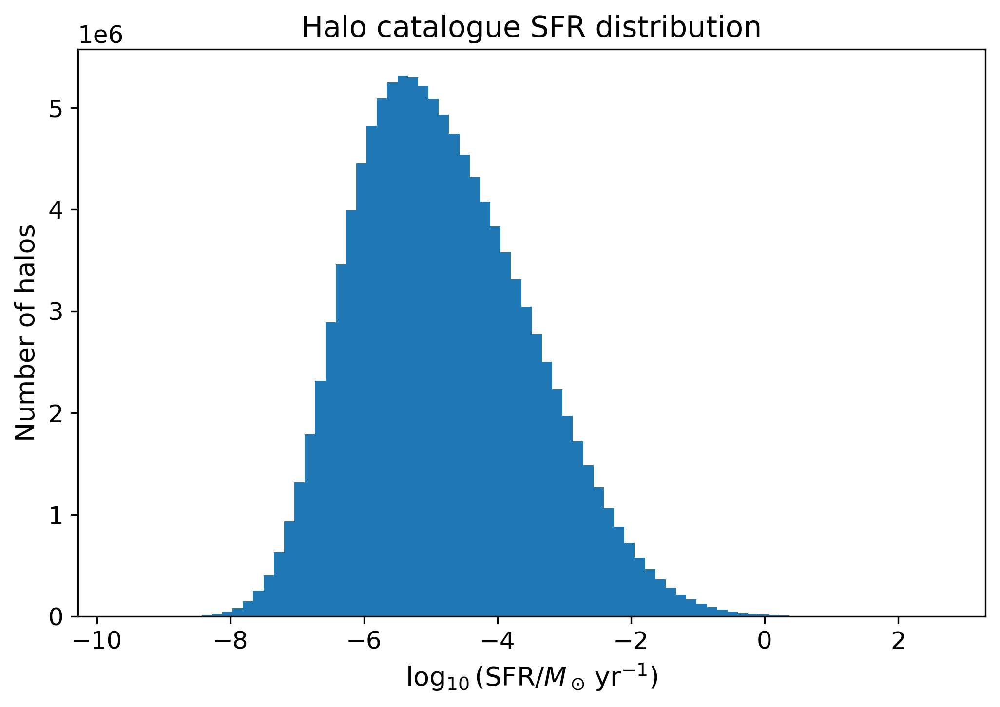

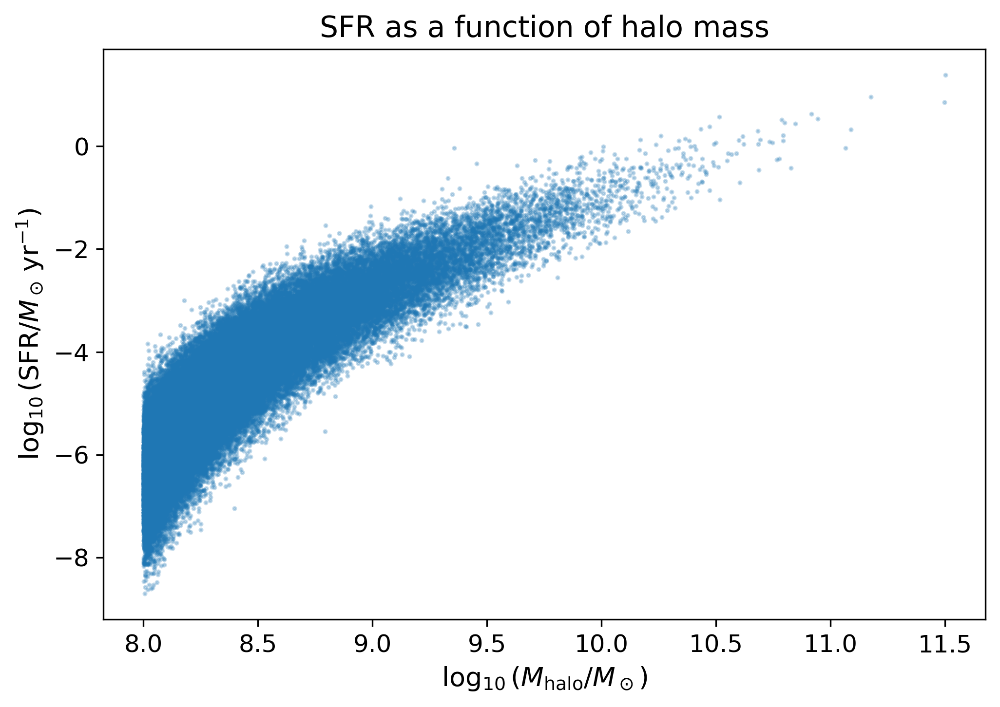

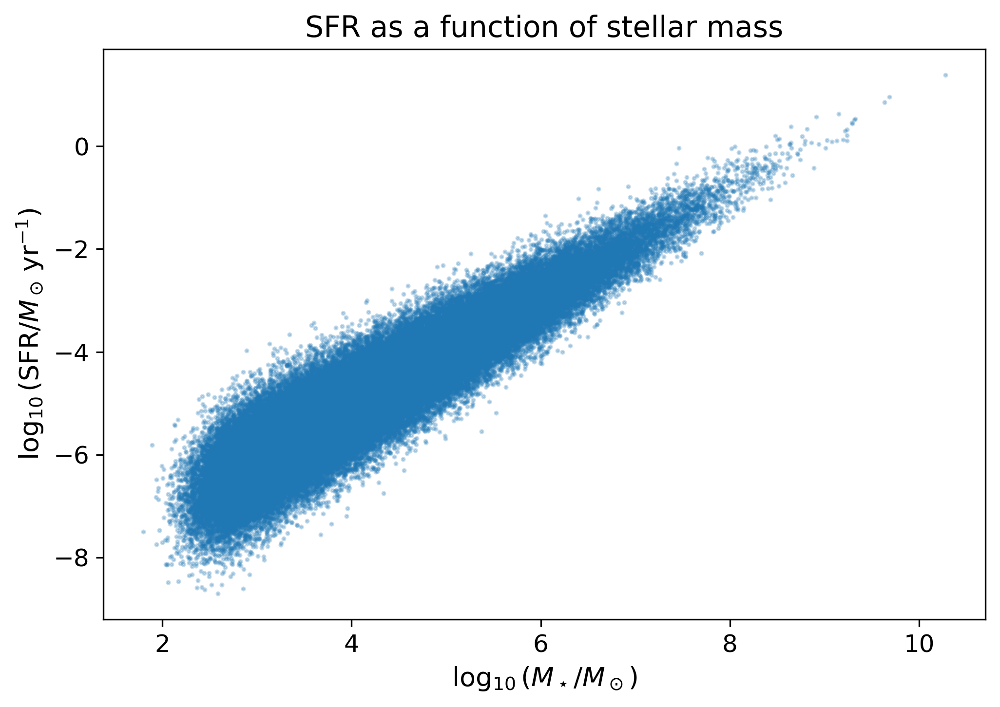

TypeError: ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''

In [14]:
# ==========================================================================
# Plot SFR values from a 21cmFASTv4 PerturbedHaloCatalog
# ==========================================================================


# --------------------------------------------------------------------------
# Helper: safely extract values from 21cmFAST Array objects
# --------------------------------------------------------------------------

def get_21cmfast_array(x):
    """
    Convert a 21cmFAST Array-like object to a NumPy array.

    21cmFAST wrapper arrays often store the actual numerical data in `.value`.
    This helper handles both wrapper arrays and ordinary NumPy arrays.
    """
    if hasattr(x, "value"):
        return np.asarray(x.value)
    return np.asarray(x)


# --------------------------------------------------------------------------
# Extract halo properties
# --------------------------------------------------------------------------

halo_masses = get_21cmfast_array(perturbed_halos.halo_masses)
stellar_masses = get_21cmfast_array(perturbed_halos.stellar_masses)
sfr = get_21cmfast_array(perturbed_halos.sfr)

# py21cmfast v4 returns `perturbed_halos.sfr` in M_sun s^-1 (the internal
# C unit), NOT M_sun yr^-1 as the docs state. Convert before any UV
# calibration or literature comparison. See docs/Low_SFR_fix.md.
_SEC_PER_YR = 365.25 * 24 * 3600          # 3.15576e7 s yr^-1
sfr = np.asarray(sfr, dtype=float) * _SEC_PER_YR   # -> M_sun yr^-1

# Optional fields
sfr_mini = None
fesc_sfr = None

if hasattr(perturbed_halos, "sfr_mini"):
    sfr_mini = get_21cmfast_array(perturbed_halos.sfr_mini)

if hasattr(perturbed_halos, "fesc_sfr"):
    fesc_sfr = get_21cmfast_array(perturbed_halos.fesc_sfr)

# --------------------------------------------------------------------------
# Basic diagnostics
# --------------------------------------------------------------------------

print("Catalogue diagnostics")
print("---------------------")
print(f"N_halos = {len(sfr):,}")
print(f"SFR shape = {sfr.shape}")
print(f"SFR finite values = {np.isfinite(sfr).sum():,}")

positive_sfr = sfr[np.isfinite(sfr) & (sfr > 0)]

print(f"N halos with SFR > 0 = {len(positive_sfr):,}")
print(f"SFR min/max = {positive_sfr.min():.3e} - {positive_sfr.max():.3e} Msun/yr")
print(f"SFR median = {np.median(positive_sfr):.3e} Msun/yr")

# --------------------------------------------------------------------------
# Subsample for scatter plots if catalogue is huge
# --------------------------------------------------------------------------

max_points = 100_000
rng = np.random.default_rng(42)

valid = (
    np.isfinite(halo_masses)
    & np.isfinite(stellar_masses)
    & np.isfinite(sfr)
    & (halo_masses > 0)
    & (stellar_masses > 0)
    & (sfr > 0)
)

valid_idx = np.where(valid)[0]

if len(valid_idx) > max_points:
    plot_idx = rng.choice(valid_idx, size=max_points, replace=False)
else:
    plot_idx = valid_idx

# ==========================================================================
# Plot 1: SFR histogram
# ==========================================================================

plt.figure(figsize=(7, 5))

plt.hist(
    np.log10(positive_sfr),
    bins=80,
)

plt.xlabel(r"$\log_{10}(\mathrm{SFR}/M_\odot\,\mathrm{yr}^{-1})$")
plt.ylabel("Number of halos")
plt.title("Halo catalogue SFR distribution")
plt.tight_layout()
plt.show()

# ==========================================================================
# Plot 2: SFR vs halo mass
# ==========================================================================

plt.figure(figsize=(7, 5))

plt.scatter(
    np.log10(halo_masses[plot_idx]),
    np.log10(sfr[plot_idx]),
    s=2,
    alpha=0.25,
)

plt.xlabel(r"$\log_{10}(M_{\rm halo}/M_\odot)$")
plt.ylabel(r"$\log_{10}(\mathrm{SFR}/M_\odot\,\mathrm{yr}^{-1})$")
plt.title("SFR as a function of halo mass")
plt.tight_layout()
plt.show()

# ==========================================================================
# Plot 3: SFR vs stellar mass
# ==========================================================================

plt.figure(figsize=(7, 5))

plt.scatter(
    np.log10(stellar_masses[plot_idx]),
    np.log10(sfr[plot_idx]),
    s=2,
    alpha=0.25,
)

plt.xlabel(r"$\log_{10}(M_\star/M_\odot)$")
plt.ylabel(r"$\log_{10}(\mathrm{SFR}/M_\odot\,\mathrm{yr}^{-1})$")
plt.title("SFR as a function of stellar mass")
plt.tight_layout()
plt.show()

# ==========================================================================
# Plot 4: Optional comparison with minihalo SFR
# ==========================================================================

if sfr_mini is not None:
    valid_mini = np.isfinite(sfr_mini) & (sfr_mini > 0)

    if valid_mini.any():
        plt.figure(figsize=(7, 5))

        plt.hist(
            np.log10(sfr[np.isfinite(sfr) & (sfr > 0)]),
            bins=80,
            alpha=0.6,
            label="sfr",
        )

        plt.hist(
            np.log10(sfr_mini[valid_mini]),
            bins=80,
            alpha=0.6,
            label="sfr_mini",
        )

        plt.xlabel(r"$\log_{10}(\mathrm{SFR}/M_\odot\,\mathrm{yr}^{-1})$")
        plt.ylabel("Number of halos")
        plt.title("SFR and minihalo SFR distributions")
        plt.legend()
        plt.tight_layout()
        plt.show()

# ==========================================================================
# Plot 5: Optional fesc-weighted SFR
# ==========================================================================

if fesc_sfr is not None:
    valid_fesc = np.isfinite(fesc_sfr) & (fesc_sfr > 0)

    if valid_fesc.any():
        plt.figure(figsize=(7, 5))

        plt.hist(
            np.log10(fesc_sfr[valid_fesc]),
            bins=80,
        )

        plt.xlabel(r"$\log_{10}(f_{\rm esc}\,\mathrm{SFR})$")
        plt.ylabel("Number of halos")
        plt.title(r"Escape-fraction-weighted SFR distribution")
        plt.tight_layout()
        plt.show()

## 3  Construct the galaxy density field

### 3a  From the 21cmFASTv4 lightcone halobox

The lightcone stores `halo_sfr`: the per-cell SFR density integrated over all halos,
evaluated at each LOS slice. This naturally traces UV-bright galaxies as in the
coeval case, but now evolves continuously along the line of sight.

### 3b  Synthetic fallback

If 21cmFAST is unavailable, a biased Poisson-sampled galaxy field is generated
from the density field, anti-correlated with the 21 cm signal.

In [ ]:
cell_volume = cell_size**3

if HAS_21CMFAST:
    print("Constructing galaxy density field from lightcone halobox …")

    sfr_field = lightcone.lightcones["halo_sfr"]   # (HII_DIM, HII_DIM, N_z)

    mean_sfr = sfr_field.mean()
    if mean_sfr > 0:
        galaxy_overdensity = sfr_field / mean_sfr - 1.0
    else:
        galaxy_overdensity = np.zeros_like(sfr_field)

    print(f"  SFR density  : [{sfr_field.min():.2e}, {sfr_field.max():.2e}] (internal units)")
    print(f"  Galaxy δ     : [{galaxy_overdensity.min():.2f}, {galaxy_overdensity.max():.2f}]")
    print(f"  Shot-noise n̄ : {mean_galaxy_density:.2e} h³ Mpc⁻³  (survey parameter)")

else:
    print("Generating synthetic galaxy field …")

    expected_counts = (
        mean_galaxy_density
        * cell_volume
        * np.exp(galaxy_bias * density_field)
        * (1.0 - neutral_fraction)
    )
    galaxy_counts      = np.random.poisson(np.clip(expected_counts, 0, 50)).astype(float)
    mean_count         = galaxy_counts.mean()
    galaxy_overdensity = galaxy_counts / max(mean_count, 1e-10) - 1.0

    print(f"Mean galaxy density : {mean_count / cell_volume:.2e} h³ Mpc⁻³")
    print(f"Total galaxies      : {int(galaxy_counts.sum())}")

Constructing galaxy density field from lightcone halobox …
  SFR density  : [0.00e+00, 1.47e-06] (internal units)
  Galaxy δ     : [-1.00, 2265.61]
  Shot-noise n̄ : 3.00e-03 h³ Mpc⁻³  (survey parameter)


In [ ]:
# ==========================================================================
# Estimate Euclid galaxy bias from luminosity-selected halo population
# ==========================================================================

from hmf import MassFunction
from scipy.integrate import simpson

# --------------------------------------------------------------------------
# Euclid absolute UV magnitude limits
# More negative = brighter
# --------------------------------------------------------------------------
# M_UV_bright / M_UV_faint come from the CONFIGURATION cell so that the bias
# integral below is evaluated over exactly the sample selected in the
# UV-selection cell. Do not redefine them here.

L_UV_min = Muv_to_Luv(M_UV_faint)    # faint limit
L_UV_max = Muv_to_Luv(M_UV_bright)   # bright limit

print(f"L_UV range = {L_UV_min:.3e} - {L_UV_max:.3e} erg s^-1 Hz^-1")

# --------------------------------------------------------------------------
# 21cmFAST-like stellar-halo relation
# --------------------------------------------------------------------------

F_STAR10   = 0.05
ALPHA_STAR = 0.5
M_TURN     = 5e8

OMEGA_B_0 = 0.049
# OMEGA_M_0 comes from the CONFIGURATION cell — do not redefine it here.

def f_star(M_h):
    return F_STAR10 * (M_h / 1e10)**ALPHA_STAR * np.exp(-M_TURN / M_h)

def stellar_mass(M_h):
    return f_star(M_h) * (OMEGA_B_0 / OMEGA_M_0) * M_h

def sfr(M_h):
    # approximate star-formation timescale = 100 Myr
    return stellar_mass(M_h) / 1e8

def uv_luminosity(M_h):
    return 1.15e28 * sfr(M_h)

# --------------------------------------------------------------------------
# Halo mass function
# --------------------------------------------------------------------------

mf = MassFunction(
    z=z_obs,
    Mmin=7,
    Mmax=13,
    dlog10m=0.02,
)

M_h = mf.m
dndlog10m = mf.dndlog10m #log10 of the halo mass

# --------------------------------------------------------------------------
# Halo bias: Sheth-Tormen style analytic bias using mf.nu
# --------------------------------------------------------------------------

def sheth_tormen_bias_from_nu(nu, delta_c=1.686, a=0.707, p=0.3):
    return 1.0 + (a * nu**2 - 1.0) / delta_c + (
        2.0 * p / (delta_c * (1.0 + (a * nu**2)**p))
    )

halo_bias = sheth_tormen_bias_from_nu(mf.nu)

# --------------------------------------------------------------------------
# Euclid selection
# --------------------------------------------------------------------------

L_UV = uv_luminosity(M_h)

selected = (L_UV >= L_UV_min) & (L_UV <= L_UV_max)

if selected.sum() < 2:
    raise RuntimeError(
        "Too few halos satisfy the luminosity selection. "
        "Check M_UV limits or the stellar-halo/SFR parameters."
    )

# --------------------------------------------------------------------------
# Effective galaxy number density and bias
# --------------------------------------------------------------------------

logM = np.log10(M_h)

n_gal = simpson(
    dndlog10m[selected],
    x=logM[selected],
)

galaxy_bias = simpson(
    dndlog10m[selected] * halo_bias[selected],
    x=logM[selected],
) / n_gal

print(f"n_gal = {n_gal:.3e} Mpc^-3")
print(f"Estimated Euclid galaxy bias = {galaxy_bias:.2f}")
print(
    f"Selected halo mass range: "
    f"{M_h[selected].min():.2e} - {M_h[selected].max():.2e} Msun"
)

L_UV range = 7.112e+27 - 2.831e+29 erg s^-1 Hz^-1
n_gal = 2.368e-02 Mpc^-3
Estimated Euclid galaxy bias = 33.39
Selected halo mass range: 9.12e+09 - 1.00e+11 Msun


UV luminosity diagnostics
-------------------------
N halos total       = 114,291,212
N halos with SFR>0  = 114,291,212
SFR range           = 6.823e-18 - 1.546e-05 M_sun/yr
L_UV range          = 5.933e+10 - 1.344e+23 erg/s/Hz
M_UV range          = -6.22 - 24.67

Coordinate diagnostics
----------------------
coords min/max = 0.000, 256.000
BOX_LEN        = 256.0
HII_DIM        = 128


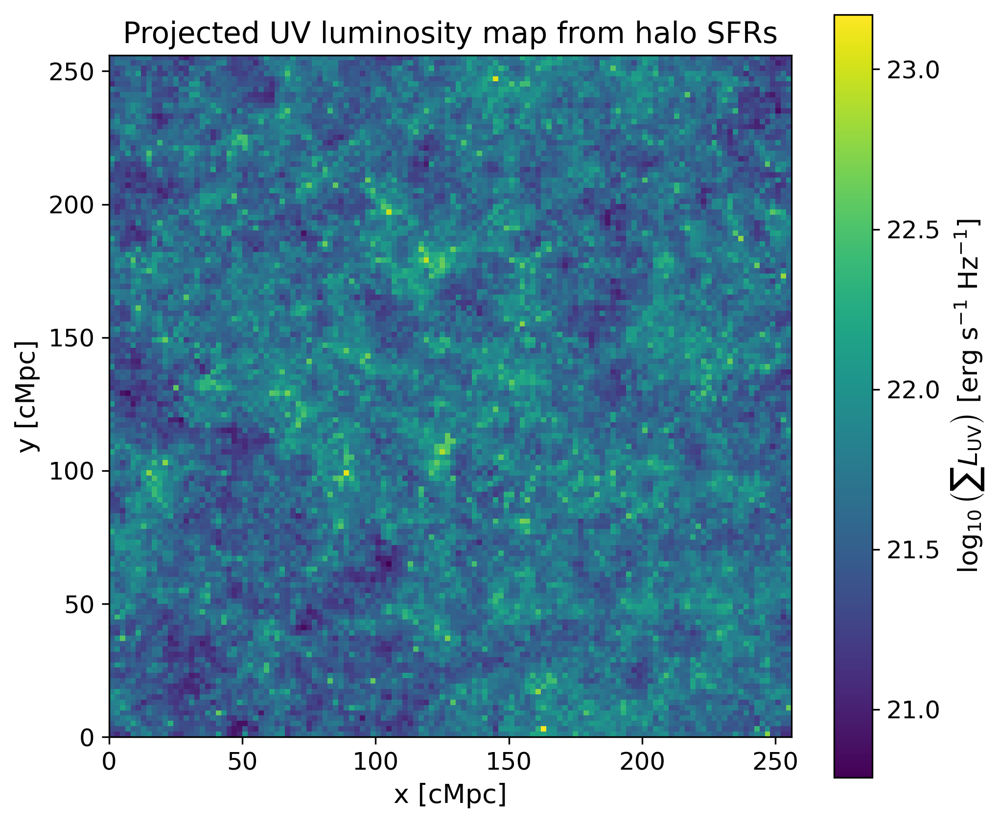

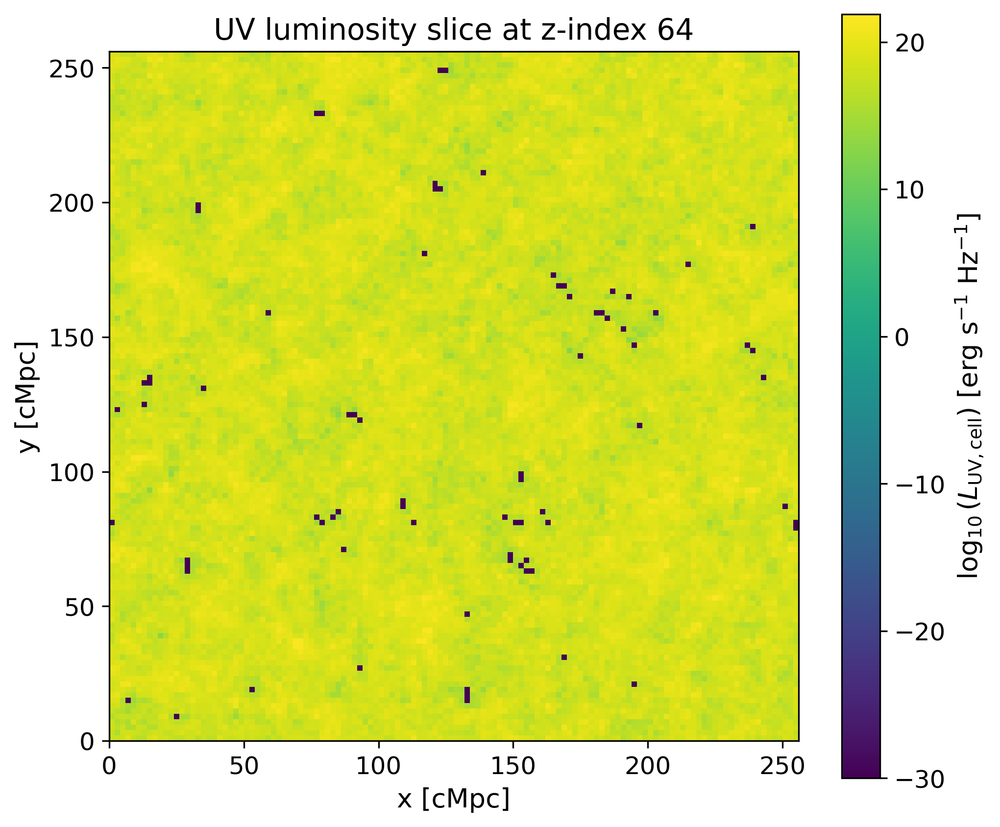

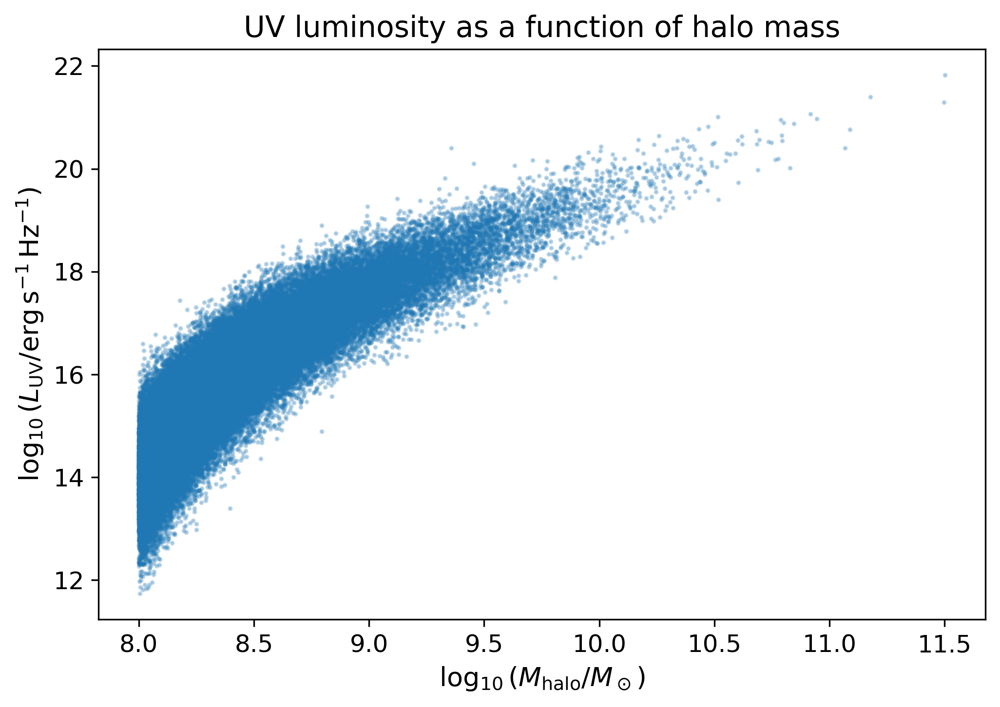

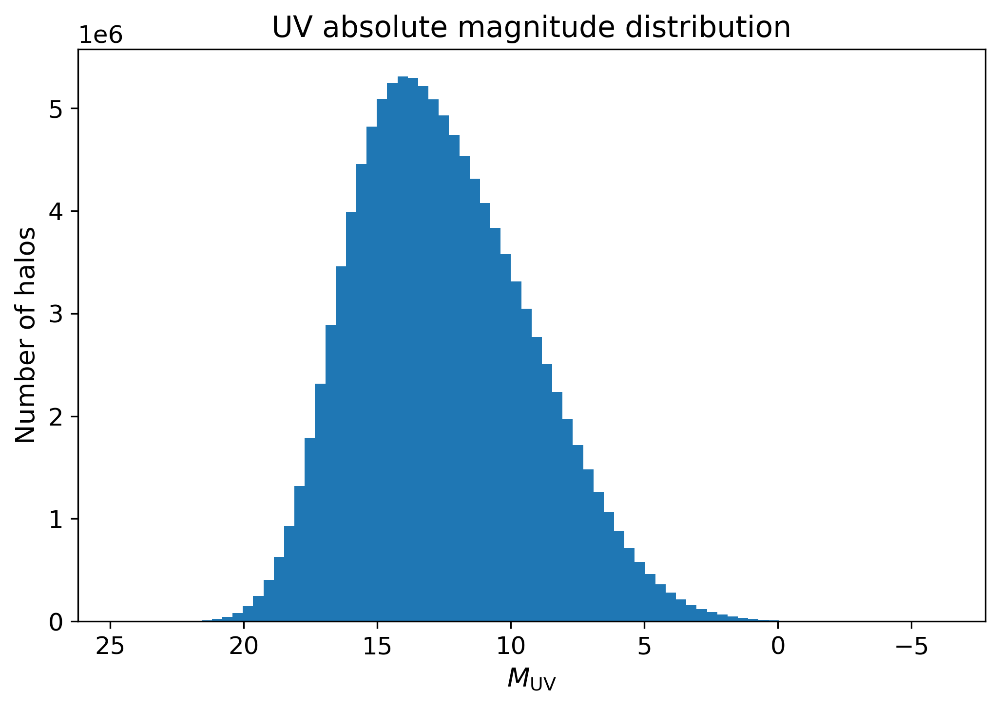

In [ ]:
# ==========================================================================
# Convert halo SFRs to UV luminosities and plot UV luminosity map
# ==========================================================================


# --------------------------------------------------------------------------
# Helper for 21cmFAST Array objects
# --------------------------------------------------------------------------

# `get_21cmfast_array` is defined once, in the halo-catalogue cell above.

# --------------------------------------------------------------------------
# Extract halo catalogue quantities
# --------------------------------------------------------------------------

halo_coords = get_21cmfast_array(perturbed_halos.halo_coords)
halo_masses = get_21cmfast_array(perturbed_halos.halo_masses)
sfr = get_21cmfast_array(perturbed_halos.sfr)

# py21cmfast v4 returns `perturbed_halos.sfr` in M_sun s^-1 (the internal
# C unit), NOT M_sun yr^-1 as the docs state. Convert before any UV
# calibration or literature comparison. See docs/Low_SFR_fix.md.
_SEC_PER_YR = 365.25 * 24 * 3600          # 3.15576e7 s yr^-1
sfr = np.asarray(sfr, dtype=float) * _SEC_PER_YR   # -> M_sun yr^-1

# Clean SFR values
sfr[~np.isfinite(sfr)] = 0.0
sfr[sfr < 0] = 0.0

# --------------------------------------------------------------------------
# SFR -> UV luminosity
# --------------------------------------------------------------------------
# Uses the project-wide Madau & Dickinson (2014) calibration
# (kappa_UV = 1.15e-28, Chabrier IMF) from src/conversions.py, so the
# notebook cannot drift from run_simulation.py and the analysis notebooks.
# To compare against Kennicutt (1998, Salpeter), pass kappa_uv=1.4e-28.

L_UV = sfr_to_Luv(sfr)  # erg s^-1 Hz^-1

# AB absolute magnitude corresponding to L_nu
# M_AB = -2.5 log10(L_nu) + 51.60

M_UV = np.full_like(L_UV, np.inf, dtype=float)

positive_lum = L_UV > 0
M_UV[positive_lum] = -2.5 * np.log10(L_UV[positive_lum]) + 51.60

print("UV luminosity diagnostics")
print("-------------------------")
print(f"N halos total       = {len(sfr):,}")
print(f"N halos with SFR>0  = {(sfr > 0).sum():,}")
print(f"SFR range           = {sfr[sfr > 0].min():.3e} - {sfr.max():.3e} M_sun/yr")
print(f"L_UV range          = {L_UV[L_UV > 0].min():.3e} - {L_UV.max():.3e} erg/s/Hz")
print(f"M_UV range          = {np.nanmin(M_UV[np.isfinite(M_UV)]):.2f} - {np.nanmax(M_UV[np.isfinite(M_UV)]):.2f}")


# --------------------------------------------------------------------------
# Convert halo coordinates to grid indices
# --------------------------------------------------------------------------
# Assumption:
#   halo_coords are comoving positions in Mpc inside a box of side BOX_LEN.
#
# If your coordinates are instead grid coordinates, this still works when
# BOX_LEN == HII_DIM, but check the printed diagnostics.

coords = np.asarray(halo_coords, dtype=float)

print("\nCoordinate diagnostics")
print("----------------------")
print(f"coords min/max = {coords.min():.3f}, {coords.max():.3f}")
print(f"BOX_LEN        = {BOX_LEN}")
print(f"HII_DIM        = {HII_DIM}")

cell_size = BOX_LEN / HII_DIM

# If coords are in Mpc, divide by cell size.
# If coords are already grid-like and BOX_LEN == HII_DIM, this is identical.
grid_coords = np.floor(coords / cell_size).astype(int)
grid_coords = np.mod(grid_coords, HII_DIM)

ix = grid_coords[:, 0]
iy = grid_coords[:, 1]
iz = grid_coords[:, 2]


# --------------------------------------------------------------------------
# Paint UV luminosity into a 3D grid
# --------------------------------------------------------------------------
# luminosity_grid[x, y, z] = sum of L_UV from halos in that cell

luminosity_grid = np.zeros((HII_DIM, HII_DIM, HII_DIM), dtype=np.float64)

np.add.at(
    luminosity_grid,
    (ix, iy, iz),
    L_UV,
)

# Optional luminosity density field
cell_volume = cell_size**3  # Mpc^3
luminosity_density_grid = luminosity_grid / cell_volume  # erg s^-1 Hz^-1 Mpc^-3


# --------------------------------------------------------------------------
# Plot 1: projected luminosity map
# --------------------------------------------------------------------------
# Sum along the z-axis to produce a 2D projected map.

projected_L_UV = luminosity_grid.sum(axis=2)

plt.figure(figsize=(7, 6))

plt.imshow(
    np.log10(projected_L_UV.T + 1e-30),
    origin="lower",
    extent=[0, BOX_LEN, 0, BOX_LEN],
    interpolation="nearest",
)

plt.colorbar(label=r"$\log_{10}\left(\sum L_{\rm UV}\right)$ [erg s$^{-1}$ Hz$^{-1}$]")
plt.xlabel("x [cMpc]")
plt.ylabel("y [cMpc]")
plt.title("Projected UV luminosity map from halo SFRs")
plt.tight_layout()
plt.show()


# --------------------------------------------------------------------------
# Plot 2: thin slice luminosity map
# --------------------------------------------------------------------------

slice_index = HII_DIM // 2

slice_L_UV = luminosity_grid[:, :, slice_index]

plt.figure(figsize=(7, 6))

plt.imshow(
    np.log10(slice_L_UV.T + 1e-30),
    origin="lower",
    extent=[0, BOX_LEN, 0, BOX_LEN],
    interpolation="nearest",
)

plt.colorbar(label=r"$\log_{10}(L_{\rm UV, cell})$ [erg s$^{-1}$ Hz$^{-1}$]")
plt.xlabel("x [cMpc]")
plt.ylabel("y [cMpc]")
plt.title(f"UV luminosity slice at z-index {slice_index}")
plt.tight_layout()
plt.show()


# --------------------------------------------------------------------------
# Plot 3: halo UV luminosity versus halo mass
# --------------------------------------------------------------------------

valid = (
    np.isfinite(halo_masses)
    & np.isfinite(L_UV)
    & (halo_masses > 0)
    & (L_UV > 0)
)

max_points = 100_000
rng = np.random.default_rng(42)
valid_idx = np.where(valid)[0]

if len(valid_idx) > max_points:
    plot_idx = rng.choice(valid_idx, size=max_points, replace=False)
else:
    plot_idx = valid_idx

plt.figure(figsize=(7, 5))

plt.scatter(
    np.log10(halo_masses[plot_idx]),
    np.log10(L_UV[plot_idx]),
    s=2,
    alpha=0.25,
)

plt.xlabel(r"$\log_{10}(M_{\rm halo}/M_\odot)$")
plt.ylabel(r"$\log_{10}(L_{\rm UV}/{\rm erg\,s^{-1}\,Hz^{-1}})$")
plt.title("UV luminosity as a function of halo mass")
plt.tight_layout()
plt.show()


# --------------------------------------------------------------------------
# Plot 4: UV absolute magnitude distribution
# --------------------------------------------------------------------------

plt.figure(figsize=(7, 5))

plt.hist(
    M_UV[np.isfinite(M_UV)],
    bins=80,
)

plt.gca().invert_xaxis()
plt.xlabel(r"$M_{\rm UV}$")
plt.ylabel("Number of halos")
plt.title("UV absolute magnitude distribution")
plt.tight_layout()
plt.show()

In [ ]:
# ==========================================================================
# Apply Euclid-like UV magnitude selection and plot selected luminosity map
# ==========================================================================


# --------------------------------------------------------------------------
# Magnitude cuts
# --------------------------------------------------------------------------
# More negative M_UV = brighter. Selects galaxies with
#     M_UV_bright <= M_UV <= M_UV_faint
# using the cuts set in the CONFIGURATION cell.

selected = (
    np.isfinite(M_UV)
    & (M_UV >= M_UV_bright)
    & (M_UV <= M_UV_faint)
    & (L_UV > 0)
)

print("Euclid-like UV selection")
print("-----------------------")
print(f"M_UV range selected : {M_UV_bright} <= M_UV <= {M_UV_faint}")
print(f"Selected halos      : {selected.sum():,} / {len(M_UV):,}")
print(f"Selected fraction   : {selected.mean():.3e}")

if selected.sum() == 0:
    raise RuntimeError("No halos pass the M_UV selection. Check SFR calibration or magnitude limits.")

print(f"Selected L_UV range : {L_UV[selected].min():.3e} - {L_UV[selected].max():.3e} erg/s/Hz")
print(f"Selected SFR range  : {sfr[selected].min():.3e} - {sfr[selected].max():.3e} M_sun/yr")
print(f"Selected M_UV range : {M_UV[selected].min():.2f} - {M_UV[selected].max():.2f}")

# --------------------------------------------------------------------------
# Paint only selected galaxies into the 3D grid
# --------------------------------------------------------------------------

selected_luminosity_grid = np.zeros((HII_DIM, HII_DIM, HII_DIM), dtype=np.float64)
selected_counts_grid = np.zeros((HII_DIM, HII_DIM, HII_DIM), dtype=np.float64)

np.add.at(
    selected_luminosity_grid,
    (ix[selected], iy[selected], iz[selected]),
    L_UV[selected],
)

np.add.at(
    selected_counts_grid,
    (ix[selected], iy[selected], iz[selected]),
    1.0,
)

cell_volume = (BOX_LEN / HII_DIM) ** 3
selected_luminosity_density_grid = selected_luminosity_grid / cell_volume

# Galaxy overdensity field from selected catalogue
mean_selected_count = selected_counts_grid.mean()

if mean_selected_count > 0:
    selected_galaxy_overdensity = selected_counts_grid / mean_selected_count - 1.0
else:
    selected_galaxy_overdensity = np.zeros_like(selected_counts_grid)

print(f"Mean selected count per cell = {mean_selected_count:.3e}")
print(f"Total selected galaxies      = {selected_counts_grid.sum():.0f}")

# --------------------------------------------------------------------------
# Plot 1: projected selected UV luminosity map
# --------------------------------------------------------------------------

projected_selected_L_UV = selected_luminosity_grid.sum(axis=2)

plt.figure(figsize=(7, 6))

plt.imshow(
    np.log10(projected_selected_L_UV.T + 1e-30),
    origin="lower",
    extent=[0, BOX_LEN, 0, BOX_LEN],
    interpolation="nearest",
)

plt.colorbar(
    label=r"$\log_{10}\left(\sum L_{\rm UV, selected}\right)$ [erg s$^{-1}$ Hz$^{-1}$]"
)

plt.xlabel("x [cMpc]")
plt.ylabel("y [cMpc]")
plt.title(rf"Projected UV luminosity map, ${M_UV_bright} \leq M_{{UV}} \leq {M_UV_faint}$")
plt.tight_layout()
plt.show()

# --------------------------------------------------------------------------
# Plot 2: projected selected galaxy count map
# --------------------------------------------------------------------------

projected_selected_counts = selected_counts_grid.sum(axis=2)

plt.figure(figsize=(7, 6))

plt.imshow(
    projected_selected_counts.T,
    origin="lower",
    extent=[0, BOX_LEN, 0, BOX_LEN],
    interpolation="nearest",
)

plt.colorbar(label="Selected galaxy counts")
plt.xlabel("x [cMpc]")
plt.ylabel("y [cMpc]")
plt.title(rf"Projected selected galaxy counts, ${M_UV_bright} \leq M_{{UV}} \leq {M_UV_faint}$")
plt.tight_layout()
plt.show()

# --------------------------------------------------------------------------
# Plot 3: thin-slice selected UV luminosity map
# --------------------------------------------------------------------------

slice_index = HII_DIM // 2
slice_selected_L_UV = selected_luminosity_grid[:, :, slice_index]

plt.figure(figsize=(7, 6))

plt.imshow(
    np.log10(slice_selected_L_UV.T + 1e-30),
    origin="lower",
    extent=[0, BOX_LEN, 0, BOX_LEN],
    interpolation="nearest",
)

plt.colorbar(
    label=r"$\log_{10}(L_{\rm UV, selected, cell})$ [erg s$^{-1}$ Hz$^{-1}$]"
)

plt.xlabel("x [cMpc]")
plt.ylabel("y [cMpc]")
plt.title(rf"Selected UV luminosity slice, z-index {slice_index}")
plt.tight_layout()
plt.show()

# --------------------------------------------------------------------------
# Plot 4: selected M_UV distribution
# --------------------------------------------------------------------------

plt.figure(figsize=(7, 5))

plt.hist(
    M_UV[selected],
    bins=50,
)

plt.gca().invert_xaxis()
plt.xlabel(r"$M_{\rm UV}$")
plt.ylabel("Number of selected halos")
plt.title("Selected UV absolute magnitude distribution")
plt.tight_layout()
plt.show()

# --------------------------------------------------------------------------
# Plot 5: selected UV luminosity vs halo mass
# --------------------------------------------------------------------------

valid_selected = (
    selected
    & np.isfinite(halo_masses)
    & (halo_masses > 0)
    & np.isfinite(L_UV)
    & (L_UV > 0)
)

valid_idx = np.where(valid_selected)[0]

max_points = 100_000
rng = np.random.default_rng(42)

if len(valid_idx) > max_points:
    plot_idx = rng.choice(valid_idx, size=max_points, replace=False)
else:
    plot_idx = valid_idx

plt.figure(figsize=(7, 5))

plt.scatter(
    np.log10(halo_masses[plot_idx]),
    M_UV[plot_idx],
    s=2,
    alpha=0.3,
)

plt.axhline(M_UV_faint, linestyle="--", label="Faint cut")
plt.axhline(M_UV_bright, linestyle="--", label="Bright cut")

plt.gca().invert_yaxis()
plt.xlabel(r"$\log_{10}(M_{\rm halo}/M_\odot)$")
plt.ylabel(r"$M_{\rm UV}$")
plt.title("Selected galaxies in halo mass - UV magnitude space")
plt.legend()
plt.tight_layout()
plt.show()

Euclid-like UV selection
-----------------------
M_UV range selected : -22.66 <= M_UV <= -18.0
Selected halos      : 0 / 114,291,212
Selected fraction   : 0.000e+00


RuntimeError: No halos pass the M_UV selection. Check SFR calibration or magnitude limits.

## 4  Kaiser redshift-space distortion

The galaxy overdensity is boosted along the LOS by coherent infall (Kaiser 1987):

$$\delta_{\rm gal}^{(s)}(\mathbf{k}) = \bigl(1 + \beta\,\mu^2\bigr)\,\delta_{\rm gal}(\mathbf{k}),
\qquad \beta = f/b$$

The growth rate $f$ and bias $b$ are evaluated at the reference redshift
$z_{\rm obs}$ (midpoint of the lightcone). The non-cubic box shape
$(HII\_DIM, HII\_DIM, N_z)$ is accounted for in the wavenumber grids.

In [ ]:
# ── Growth rate and bias at z_obs ─────────────────────────────────────────
Omega_m_z   = OMEGA_M_0 * (1 + z_obs)**3 / (
    OMEGA_M_0 * (1 + z_obs)**3 + (1 - OMEGA_M_0)
)
growth_rate = Omega_m_z ** 0.55           # f(z)
beta_rsd    = growth_rate / galaxy_bias   # β = f / b

print(f"Reference redshift z_obs = {z_obs}")
print(f"Ω_m(z_obs)  = {Omega_m_z:.4f}")
print(f"Growth rate f  = {growth_rate:.4f}")
print(f"Galaxy bias b  = {galaxy_bias}")
print(f"β = f/b        = {beta_rsd:.4f}")

# ── Wavenumber grids for non-cubic lightcone box ──────────────────────────
#   Transverse: N × N cells, spacing = cell_size [Mpc]
#   LOS       : N_z cells,   spacing = L_los / N_z [Mpc]
N       = HII_DIM
dz_cell = L_los / N_z   # LOS cell size  [Mpc]

kx = np.fft.fftfreq(N,   d=cell_size) * 2 * np.pi
ky = np.fft.fftfreq(N,   d=cell_size) * 2 * np.pi
kz = np.fft.fftfreq(N_z, d=dz_cell)   * 2 * np.pi
KX, KY, KZ = np.meshgrid(kx, ky, kz, indexing="ij")

k_magnitude = np.sqrt(KX**2 + KY**2 + KZ**2)
k_magnitude[0, 0, 0] = 1.0   # avoid division by zero at DC

# μ = k_∥ / |k|  (LOS along z-axis)
mu = KZ / k_magnitude
mu[0, 0, 0] = 0.0

# Apply Kaiser boost in Fourier space
kaiser_factor = 1.0 + beta_rsd * mu**2
galaxy_overdensity_k   = np.fft.fftn(galaxy_overdensity)
galaxy_overdensity_rsd = np.fft.ifftn(galaxy_overdensity_k * kaiser_factor).real

print(f"\nBefore RSD  →  δ_gal std = {galaxy_overdensity.std():.3f}")
print(f"After  RSD  →  δ_gal std = {galaxy_overdensity_rsd.std():.3f}")
print(f"Max Kaiser boost (μ=1)   = {1 + beta_rsd:.3f}×")

galaxy_overdensity = galaxy_overdensity_rsd

Reference redshift z_obs = 7.0
Ω_m(z_obs)  = 0.9958
Growth rate f  = 0.9977
Galaxy bias b  = 33.388941586313706
β = f/b        = 0.0299

Before RSD  →  δ_gal std = 5.394
After  RSD  →  δ_gal std = 5.447
Max Kaiser boost (μ=1)   = 1.030×


## 5  Visualise the lightcone fields

Three panels showing the lightcone:
- **Left**: transverse (x–y) slice at the mid-point of the LOS
- **Centre**: LOS (x–z) slice showing redshift evolution of 21 cm emission
- **Right**: neutral fraction along the same LOS slice

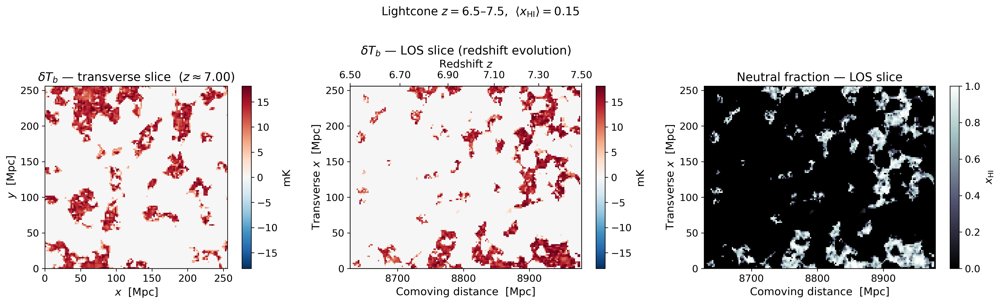

In [ ]:
mid_z = N_z // 2
mid_y = HII_DIM // 2

# Extents for imshow
# Standard convention: LOS (comoving distance) on x-axis, transverse on y-axis
extent_xy  = [0, BOX_LEN, 0, BOX_LEN]                         # transverse slice [Mpc]
extent_los = [lc_dist_Mpc[0], lc_dist_Mpc[-1], 0, BOX_LEN]   # LOS on x, transverse on y [Mpc]

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# ── Panel 1: transverse slice at mid-LOS ───────────────────────────────────
# brightness_temp_field[:, :, mid_z] has shape (HII_DIM, HII_DIM) = (x, y)
# .T → (y, x); imshow(origin="lower"): rows=y (↑), cols=x (→)  ✓
vmax_T = np.percentile(np.abs(brightness_temp_field), 99)
im0 = axes[0].imshow(
    brightness_temp_field[:, :, mid_z].T,
    origin="lower", extent=extent_xy,
    cmap="RdBu_r", vmin=-vmax_T, vmax=vmax_T,
)
fig.colorbar(im0, ax=axes[0], label="mK")
axes[0].set_title(
    rf"$\delta T_b$ — transverse slice  ($z \approx {lc_redshifts[mid_z]:.2f}$)"
)
axes[0].set_xlabel("$x$  [Mpc]")
axes[0].set_ylabel("$y$  [Mpc]")

# ── Panel 2: LOS slice — 21 cm evolution ───────────────────────────────────
# brightness_temp_field[:, mid_y, :] has shape (HII_DIM, N_z) = (x_transverse, z_los)
# WITHOUT .T: imshow(origin="lower") → rows=x (y-axis=transverse), cols=z (x-axis=LOS)
# This gives the standard orientation: LOS on x, transverse on y
im1 = axes[1].imshow(
    brightness_temp_field[:, mid_y, :],        # shape (HII_DIM, N_z), no transpose
    origin="lower", extent=extent_los, aspect="auto",
    cmap="RdBu_r", vmin=-vmax_T, vmax=vmax_T,
)
fig.colorbar(im1, ax=axes[1], label="mK")
axes[1].set_title(r"$\delta T_b$ — LOS slice (redshift evolution)")
axes[1].set_xlabel("Comoving distance  [Mpc]")
axes[1].set_ylabel("Transverse $x$  [Mpc]")

# Secondary x-axis on top: redshift labels (twiny, NOT twinx)
ax_twin = axes[1].twiny()
ax_twin.set_xlim(axes[1].get_xlim())
z_ticks = np.linspace(z_min, z_max, 6)
d_ticks = np.interp(z_ticks, lc_redshifts, lc_dist_Mpc)
ax_twin.set_xticks(d_ticks)
ax_twin.set_xticklabels([f"{z:.2f}" for z in z_ticks])
ax_twin.set_xlabel("Redshift $z$")

# ── Panel 3: neutral fraction along same LOS slice ─────────────────────────
# Same orientation fix: shape (HII_DIM, N_z), no transpose
im2 = axes[2].imshow(
    neutral_fraction[:, mid_y, :],             # shape (HII_DIM, N_z), no transpose
    origin="lower", extent=extent_los, aspect="auto",
    cmap="bone", vmin=0, vmax=1,
)
fig.colorbar(im2, ax=axes[2], label=r"$x_{\rm HI}$")
axes[2].set_title("Neutral fraction — LOS slice")
axes[2].set_xlabel("Comoving distance  [Mpc]")
axes[2].set_ylabel("Transverse $x$  [Mpc]")

mean_xHI = np.mean(neutral_fraction)
plt.suptitle(
    rf"Lightcone $z = {z_min}$–${z_max}$,  "
    rf"$\langle x_{{\rm HI}} \rangle = {mean_xHI:.2f}$",
    fontsize=14, y=1.02,
)
plt.tight_layout()
plt.show()

## 5b  Brightness temperature evolution — lightcone slice

Wide-format slice through the lightcone volume, styled after the canonical
21cm reionisation visualisation (cf. Mesinger & Furlanetto 2007).
The x-axis runs along the line of sight from the observer (left, $z_{\rm min}$)
toward the high-redshift universe (right, $z_{\rm max}$); the y-axis is one
transverse spatial direction. A custom EoR colourmap maps dark tones to
fully-ionised regions ($\delta T_b \approx 0$) and warm tones to neutral gas.

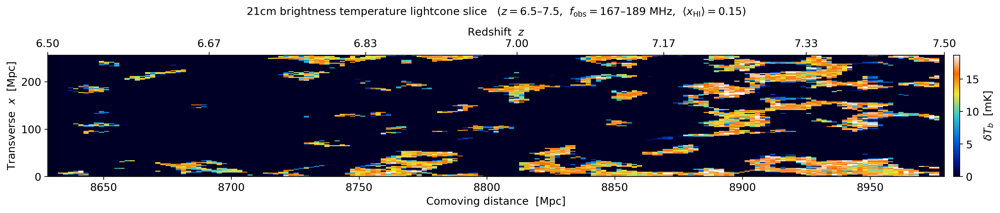

In [ ]:
from matplotlib.colors import LinearSegmentedColormap

# ── EoR-inspired colormap ─────────────────────────────────────────────────
# dark blue-black (ionised, Tb≈0) → blue → cyan → yellow → orange → near-white
# Mirrors the custom colourmap used in 21cmFAST visualisations
_eor_nodes = [
    (0.00, (0.00, 0.00, 0.15)),
    (0.12, (0.00, 0.10, 0.55)),
    (0.30, (0.00, 0.40, 0.85)),
    (0.50, (0.20, 0.78, 0.82)),
    (0.68, (0.95, 0.90, 0.22)),
    (0.85, (0.95, 0.42, 0.00)),
    (1.00, (0.97, 0.97, 0.97)),
]
eor_cmap = LinearSegmentedColormap.from_list(
    "EoR21", [(v, c) for v, c in _eor_nodes], N=256
)

# ── Lightcone slice ───────────────────────────────────────────────────────
# brightness_temp_field has shape (HII_DIM, HII_DIM, N_z).
# Taking [:, mid_y, :] → (HII_DIM, N_z) = (x_transverse, z_los).
# imshow(origin="lower") maps rows→y-axis, cols→x-axis,
# so transverse is on y and LOS is on x.  This is the standard orientation.
T_slice = brightness_temp_field[:, mid_y, :]   # (HII_DIM, N_z)

# Colour limits: clip at zero (emission-only regime at z~6–8)
T_lo = max(0.0, np.percentile(T_slice, 1))
T_hi = np.percentile(T_slice, 99.5)

fig_lc, ax_lc = plt.subplots(figsize=(16, 3.5))

im_lc = ax_lc.imshow(
    T_slice,
    origin="lower",
    extent=[lc_dist_Mpc[0], lc_dist_Mpc[-1], 0, BOX_LEN],
    aspect="auto",
    cmap=eor_cmap,
    vmin=T_lo,
    vmax=T_hi,
)
cbar = fig_lc.colorbar(im_lc, ax=ax_lc, fraction=0.015, pad=0.01)
cbar.set_label(r"$\delta T_b$  [mK]", fontsize=12)

# ── Bottom axis: comoving distance ────────────────────────────────────────
ax_lc.set_xlabel("Comoving distance  [Mpc]", fontsize=12)
ax_lc.set_ylabel("Transverse  $x$  [Mpc]", fontsize=12)

# ── Top axis: redshift ────────────────────────────────────────────────────
ax_top = ax_lc.twiny()
ax_top.set_xlim(ax_lc.get_xlim())
z_ticks = np.linspace(z_min, z_max, 7)
d_ticks = np.interp(z_ticks, lc_redshifts, lc_dist_Mpc)
ax_top.set_xticks(d_ticks)
ax_top.set_xticklabels([f"{z:.2f}" for z in z_ticks])
ax_top.set_xlabel("Redshift  $z$", fontsize=12)

# Observed frequency at each redshift tick (for reference)
f_ticks_MHz = F_21_MHZ / (1 + z_ticks)
tick_labels_freq = [
    rf"$z={z:.2f}$" + "\n" + rf"$({f:.0f}$ MHz$)$"
    for z, f in zip(z_ticks, f_ticks_MHz)
]

f_lo = F_21_MHZ / (1 + z_max)
f_hi = F_21_MHZ / (1 + z_min)
mean_xHI_val = np.mean(neutral_fraction)
ax_lc.set_title(
    rf"21cm brightness temperature lightcone slice   "
    rf"($z = {z_min}$–${z_max}$,  "
    rf"$f_{{\rm obs}} = {f_lo:.0f}$–${f_hi:.0f}$ MHz,  "
    rf"$\langle x_{{\rm HI}} \rangle = {mean_xHI_val:.2f}$)",
    fontsize=12, pad=14,
)
plt.tight_layout()
plt.show()

## 6  Compute the 2D cylindrical power spectra

The lightcone box is non-cubic: $(HII\_DIM, HII\_DIM, N_z)$ with transverse size
$L_\perp = BOX\_LEN$ and LOS size $L_{\rm LOS}$. The function below handles
this by using separate cell sizes and fundamental modes for the transverse
and LOS directions.

We compute:
- $P_{21}(k_\perp, k_\parallel)$ — 21 cm auto-power
- $P_{\rm gal}(k_\perp, k_\parallel)$ — galaxy auto-power
- $P_{21 \times \rm gal}(k_\perp, k_\parallel)$ — cross-power (expected to be **negative** on large scales)

In [ ]:
def compute_cylindrical_cross_power(
    field_a,
    field_b,
    box_len_perp,
    box_len_los,
    n_bins_perp=20,
    n_bins_parallel=20,
):
    """
    Compute the 2D cylindrical cross-power spectrum P(k_perp, k_parallel)
    for a non-cubic (lightcone) box.

    Parameters
    ----------
    field_a, field_b : ndarray, shape (N, N, N_z)
        Real-space 3D fields. Transverse dimensions are equal (N × N);
        the LOS dimension N_z may differ.
    box_len_perp : float
        Comoving side length of the transverse box  [Mpc].
    box_len_los : float
        Comoving length of the LOS axis  [Mpc].
    n_bins_perp, n_bins_parallel : int
        Number of log-spaced bins along k_perp and k_parallel.

    Returns
    -------
    k_perp_centres     : 1D array  [Mpc⁻¹]
    k_parallel_centres : 1D array  [Mpc⁻¹]
    power_2d           : 2D array, shape (n_bins_perp, n_bins_parallel)
    mode_counts        : 2D array, shape (n_bins_perp, n_bins_parallel)
    """
    N   = field_a.shape[0]   # transverse cells
    N_z = field_a.shape[2]   # LOS cells

    dx     = box_len_perp / N    # transverse cell size  [Mpc]
    dz     = box_len_los  / N_z  # LOS cell size  [Mpc]
    volume = box_len_perp**2 * box_len_los

    # ── Fourier transforms ────────────────────────────────────────────
    ft_factor = dx * dx * dz
    fourier_a = np.fft.fftn(field_a) * ft_factor
    fourier_b = np.fft.fftn(field_b) * ft_factor
    power_3d  = (fourier_a * np.conj(fourier_b)).real / volume

    # ── Wavenumber grids ──────────────────────────────────────────────
    kx = np.fft.fftfreq(N,   d=dx) * 2 * np.pi
    ky = np.fft.fftfreq(N,   d=dx) * 2 * np.pi
    kz = np.fft.fftfreq(N_z, d=dz) * 2 * np.pi
    KX, KY, KZ = np.meshgrid(kx, ky, kz, indexing="ij")

    k_perp_3d     = np.sqrt(KX**2 + KY**2)
    k_parallel_3d = np.abs(KZ)

    # ── Bin edges (log-spaced, starting below first discrete mode) ────
    dk_perp = 2 * np.pi / box_len_perp
    dk_par  = 2 * np.pi / box_len_los

    k_max_perp = np.sqrt(2) * np.abs(kx).max() * 1.05
    k_max_par  = np.abs(kz).max() * 1.05

    k_perp_edges = np.logspace(
        np.log10(0.5 * dk_perp), np.log10(k_max_perp), n_bins_perp + 1
    )
    k_par_edges = np.logspace(
        np.log10(0.5 * dk_par), np.log10(k_max_par), n_bins_parallel + 1
    )

    # ── Bin the 3D power into 2D ──────────────────────────────────────
    power_2d    = np.zeros((n_bins_perp, n_bins_parallel))
    mode_counts = np.zeros_like(power_2d)

    bin_perp = np.digitize(k_perp_3d.ravel(), k_perp_edges)    - 1
    bin_par  = np.digitize(k_parallel_3d.ravel(), k_par_edges) - 1
    power_flat = power_3d.ravel()

    inside = (
        (bin_perp >= 0) & (bin_perp < n_bins_perp) &
        (bin_par  >= 0) & (bin_par  < n_bins_parallel)
    )
    np.add.at(power_2d,    (bin_perp[inside], bin_par[inside]), power_flat[inside])
    np.add.at(mode_counts, (bin_perp[inside], bin_par[inside]), 1)

    power_2d = np.divide(
        power_2d, mode_counts,
        where=mode_counts > 0,
        out=np.full_like(power_2d, np.nan),
    )

    k_perp_centres = np.sqrt(k_perp_edges[:-1] * k_perp_edges[1:])
    k_par_centres  = np.sqrt(k_par_edges[:-1]  * k_par_edges[1:])

    return k_perp_centres, k_par_centres, power_2d, mode_counts


# ======================================================================
#  Compute all three 2D power spectra
# ======================================================================
T21_fluctuations    = brightness_temp_field - brightness_temp_field.mean()
galaxy_fluctuations = galaxy_overdensity

print("Computing 2D cylindrical power spectra …")

k_perp, k_parallel, P_21cm_auto, mode_counts = compute_cylindrical_cross_power(
    T21_fluctuations, T21_fluctuations,
    BOX_LEN, L_los, n_bins_perp, n_bins_parallel,
)
_, _, P_galaxy_auto, _ = compute_cylindrical_cross_power(
    galaxy_fluctuations, galaxy_fluctuations,
    BOX_LEN, L_los, n_bins_perp, n_bins_parallel,
)
_, _, P_cross, _ = compute_cylindrical_cross_power(
    T21_fluctuations, galaxy_fluctuations,
    BOX_LEN, L_los, n_bins_perp, n_bins_parallel,
)

large_scale_mean = np.nanmean(P_cross[:5, :5])
n_empty = np.sum(mode_counts == 0)
print(f"k_perp     range : [{k_perp.min():.4f},  {k_perp.max():.3f}] Mpc⁻¹")
print(f"k_parallel range : [{k_parallel.min():.4f},  {k_parallel.max():.3f}] Mpc⁻¹")
print(f"Empty bins       : {n_empty} / {mode_counts.size}")
print(
    f"Large-scale cross-spectrum sign: "
    f"{'NEGATIVE (anti-correlated) ✓' if large_scale_mean < 0 else 'POSITIVE'}"
)

Computing 2D cylindrical power spectra …
k_perp     range : [0.0140,  2.046] Mpc⁻¹
k_parallel range : [0.0102,  1.440] Mpc⁻¹
Empty bins       : 128 / 400
Large-scale cross-spectrum sign: NEGATIVE (anti-correlated) ✓


## 7  Plot the 2D cylindrical power spectra

Three panels showing $P_{21}$, $P_{\rm gal}$, and the signed cross-power
$P_{21\times\rm gal}$ in $(k_\perp,\, k_\parallel)$ space, with the
foreground horizon and HERA primary-beam wedge overlaid.

Reference z_obs        : 7.0
Observed wavelength    : λ = 1.690 m
Comoving distance      : D_c = 8821 Mpc
Horizon wedge slope    : m = 3.151
HERA beam half-angle   : θ = 6.9°
HERA FoV wedge slope   : m_FoV = 0.379


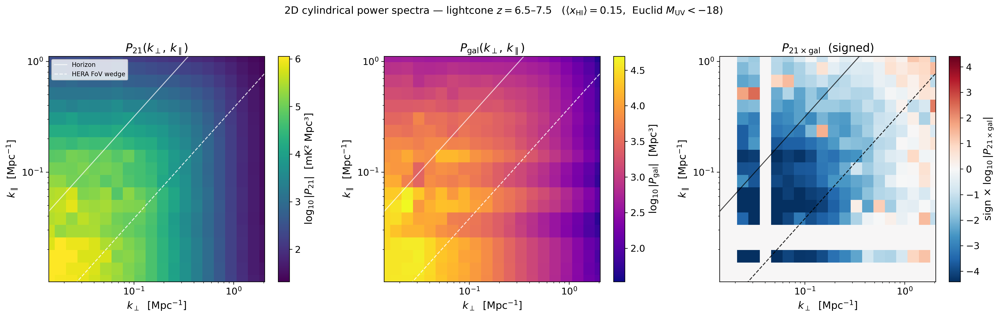

In [ ]:
def fill_nan_nearest(arr):
    """Replace NaN pixels with the nearest non-NaN neighbour (display only)."""
    mask = np.isnan(arr)
    if not mask.any():
        return arr
    filled = arr.copy()
    for _ in range(max(arr.shape)):
        if not np.isnan(filled).any():
            break
        kernel_filled = generic_filter(filled, np.nanmean, size=3, mode="nearest")
        filled = np.where(np.isnan(filled), kernel_filled, filled)
    return filled


# ======================================================================
#  Foreground wedge geometry  (Thyagarajan+2015; La Plante+2023, Eq. 10)
#  Evaluated at the reference redshift z_obs
# ======================================================================
Hz_obs = hubble_parameter(z_obs)   # H(z_obs)  [km s⁻¹ Mpc⁻¹]

comoving_distance_obs, _ = quad(
    lambda z_: SPEED_OF_LIGHT_KMS / hubble_parameter(z_), 0, z_obs
)   # D_c(z_obs)  [Mpc]

lambda_obs = SPEED_OF_LIGHT_MPS * (1 + z_obs) / F_21_HZ   # observed wavelength  [m]

# Horizon wedge slope
horizon_slope = (
    lambda_obs * comoving_distance_obs * F_21_HZ * Hz_obs
    / (SPEED_OF_LIGHT_MPS * SPEED_OF_LIGHT_KMS * (1 + z_obs)**2)
)

# HERA primary-beam wedge slope
theta_fov      = lambda_obs / HERA_DISH_DIAMETER
fov_wedge_slope = np.sin(theta_fov) * horizon_slope

k_perp_line   = np.logspace(np.log10(k_perp.min()), np.log10(k_perp.max()), 200)
k_par_horizon = k_perp_line * horizon_slope
k_par_fov     = k_perp_line * fov_wedge_slope

print(f"Reference z_obs        : {z_obs}")
print(f"Observed wavelength    : λ = {lambda_obs:.3f} m")
print(f"Comoving distance      : D_c = {comoving_distance_obs:.0f} Mpc")
print(f"Horizon wedge slope    : m = {horizon_slope:.3f}")
print(f"HERA beam half-angle   : θ = {np.degrees(theta_fov):.1f}°")
print(f"HERA FoV wedge slope   : m_FoV = {fov_wedge_slope:.3f}")

# ── Plot ──────────────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(18, 5.5))

# Panel 1: 21 cm auto-power
P21_display = fill_nan_nearest(np.log10(np.abs(P_21cm_auto.T)))
im0 = axes[0].pcolormesh(
    k_perp, k_parallel, P21_display, cmap="viridis", shading="auto"
)
fig.colorbar(im0, ax=axes[0], label=r"$\log_{10} |P_{21}|$  [mK² Mpc³]")
axes[0].plot(k_perp_line, k_par_horizon, "w-",  lw=1.2, alpha=0.7, label="Horizon")
axes[0].plot(k_perp_line, k_par_fov,     "w--", lw=1.2, alpha=0.8, label="HERA FoV wedge")
axes[0].legend(loc="upper left", fontsize=8)
axes[0].set_title(r"$P_{21}(k_\perp,\, k_\parallel)$")

# Panel 2: galaxy auto-power
Pgal_display = fill_nan_nearest(np.log10(np.abs(P_galaxy_auto.T)))
im1 = axes[1].pcolormesh(
    k_perp, k_parallel, Pgal_display, cmap="plasma", shading="auto"
)
fig.colorbar(im1, ax=axes[1], label=r"$\log_{10} |P_{\rm gal}|$  [Mpc³]")
axes[1].plot(k_perp_line, k_par_horizon, "w-",  lw=1.2, alpha=0.7)
axes[1].plot(k_perp_line, k_par_fov,     "w--", lw=1.2, alpha=0.8)
axes[1].set_title(r"$P_{\rm gal}(k_\perp,\, k_\parallel)$")

# Panel 3: signed cross-power
cross_amp      = np.abs(P_cross.T)
cross_sgn      = np.sign(P_cross.T)
signed_log_raw = np.where(cross_amp > 0, np.log10(cross_amp) * cross_sgn, 0.0)
signed_log     = fill_nan_nearest(signed_log_raw)
clim           = np.nanpercentile(np.abs(signed_log[signed_log != 0]), 95)

im2 = axes[2].pcolormesh(
    k_perp, k_parallel, signed_log,
    cmap="RdBu_r", shading="auto", vmin=-clim, vmax=clim,
)
fig.colorbar(im2, ax=axes[2],
             label=r"sign $\times$ $\log_{10} |P_{21 \times \rm gal}|$")
axes[2].plot(k_perp_line, k_par_horizon, "k-",  lw=1.2, alpha=0.7)
axes[2].plot(k_perp_line, k_par_fov,     "k--", lw=1.2, alpha=0.8)
axes[2].set_title(r"$P_{21 \times \rm gal}$  (signed)")

mean_xHI = np.mean(neutral_fraction)
for ax in axes:
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.set_xlabel(r"$k_\perp$  [Mpc$^{-1}$]")
    ax.set_ylabel(r"$k_\parallel$  [Mpc$^{-1}$]")
    ax.set_xlim(k_perp[0], k_perp[-1])
    ax.set_ylim(k_parallel[0], k_parallel[-2])

plt.suptitle(
    rf"2D cylindrical power spectra — lightcone $z = {z_min}$–${z_max}$   "
    rf"($\langle x_{{\rm HI}} \rangle = {mean_xHI:.2f}$,  "
    rf"Euclid $M_{{\rm UV}} < {M_UV_faint}$)",
    fontsize=13, y=1.02,
)
plt.tight_layout()
plt.show()

## 8  Apply photo-$z$ damping and foreground wedge

Same procedure as the coeval notebook, evaluated at the reference redshift
$z_{\rm obs}$:

1. **Photo-$z$ damping** — Euclid photometric errors smear the galaxy field along
   the LOS, suppressing $P_{\rm gal}$ by $W^2$ and $P_{21\times\rm gal}$ by $W$.
2. **Foreground wedge** — modes with $k_\parallel < k_\perp \cdot \chi H / [c(1+z)]$
   are excised.

In [ ]:
# ── Photo-z radial smearing  σ_r = c σ_z / H(z_obs) ─────────────────────
Hz_obs          = hubble_parameter(z_obs)
radial_smearing = SPEED_OF_LIGHT_KMS * photoz_uncertainty / Hz_obs   # [Mpc]

# Broadcast k_parallel over the 2D power spectrum grid
K_PAR_BROADCAST = k_parallel[np.newaxis, :]   # (1, n_bins_par)
photoz_kernel   = np.exp(-0.5 * K_PAR_BROADCAST**2 * radial_smearing**2)

# Apply damping (one factor of W for cross, two for galaxy auto)
P_cross_observed  = P_cross       * photoz_kernel
P_galaxy_observed = P_galaxy_auto * photoz_kernel**2

# ── Foreground wedge mask ──────────────────────────────────────────────────
comoving_dist_obs, _ = quad(
    lambda z_: SPEED_OF_LIGHT_KMS / hubble_parameter(z_), 0, z_obs
)
wedge_slope = comoving_dist_obs * Hz_obs / (SPEED_OF_LIGHT_KMS * (1 + z_obs))

K_PERP_GRID, K_PAR_GRID = np.meshgrid(k_perp, k_parallel, indexing="ij")
outside_wedge = K_PAR_GRID > (K_PERP_GRID * wedge_slope + wedge_buffer)

print(f"Photo-z smearing : σ_r = {radial_smearing:.1f} Mpc")
print(f"Wedge slope      : {wedge_slope:.3f}")
print(f"Modes outside wedge : {outside_wedge.sum() / outside_wedge.size:.1%}")

Photo-z smearing : σ_r = 20.6 Mpc
Wedge slope      : 3.151
Modes outside wedge : 24.2%


## 9  Cross-correlation SNR map

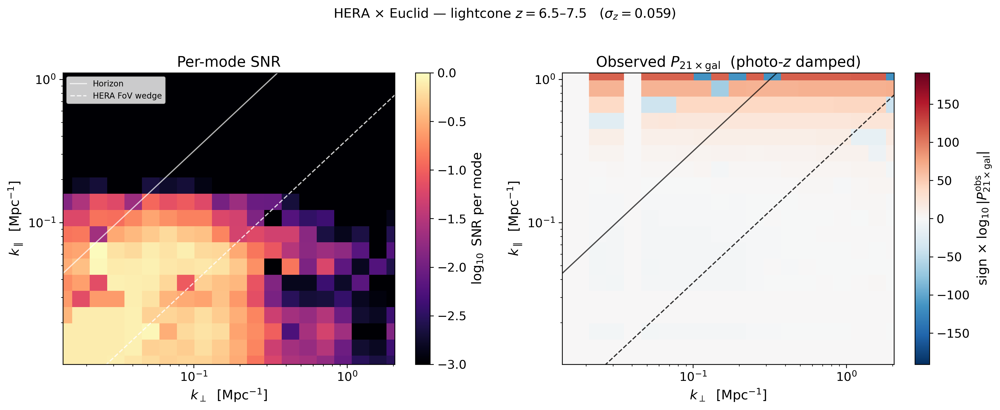


Total cross-correlation SNR (outside wedge): 0.2 σ
Detection (> 5σ) ?  NO


In [ ]:
# ── 21 cm thermal noise (simplified HERA-like estimate) ──────────────────
observed_frequency = 1.42e9 / (1 + z_obs)   # Hz
system_temperature = (
    100 + 60 * (300e6 / observed_frequency)**2.55
) * 1e3   # mK

P_noise_21cm = (
    system_temperature**2 * 1e3 / (integration_time * bandwidth)
    * np.ones_like(P_cross)
)

# ── Galaxy shot noise ──────────────────────────────────────────────────────
P_noise_galaxy = 1.0 / mean_galaxy_density

# ── Per-mode uncertainty (La Plante et al. 2023, Eqs. 15–17) ──────────────
sigma_21cm   = np.abs(P_21cm_auto)    + P_noise_21cm
sigma_galaxy = np.abs(P_galaxy_observed) + P_noise_galaxy
sigma_cross  = np.sqrt(
    0.5 * (P_cross_observed**2 + sigma_21cm * sigma_galaxy)
)

# ── SNR maps ───────────────────────────────────────────────────────────────
SNR_per_mode      = np.abs(P_cross_observed) / sigma_cross
SNR_outside_wedge = np.where(outside_wedge, SNR_per_mode, np.nan)

# ── Plot ───────────────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 5.5))

# Wedge and horizon lines for overlay
k_perp_line    = np.logspace(np.log10(k_perp.min()), np.log10(k_perp.max()), 200)
lambda_obs_    = SPEED_OF_LIGHT_KMS * 1e3 * (1 + z_obs) / F_21_HZ
horizon_slope_ = (
    lambda_obs_ * comoving_dist_obs * F_21_HZ * Hz_obs
    / (SPEED_OF_LIGHT_KMS * 1e3 * SPEED_OF_LIGHT_KMS * (1 + z_obs)**2)
)
theta_fov_     = lambda_obs_ / HERA_DISH_DIAMETER
fov_slope_     = np.sin(theta_fov_) * horizon_slope_

k_par_horizon_ = k_perp_line * horizon_slope_
k_par_fov_     = k_perp_line * fov_slope_

# Panel 1: per-mode SNR
snr_display = fill_nan_nearest(np.log10(SNR_per_mode.T))
im_snr = axes[0].pcolormesh(
    k_perp, k_parallel, snr_display,
    cmap="magma", shading="auto", vmin=-3, vmax=0,
)
fig.colorbar(im_snr, ax=axes[0], label=r"$\log_{10}$ SNR per mode")
axes[0].plot(k_perp_line, k_par_horizon_, "w-",  lw=1.2, alpha=0.7, label="Horizon")
axes[0].plot(k_perp_line, k_par_fov_,     "w--", lw=1.2, alpha=0.8, label="HERA FoV wedge")
axes[0].legend(loc="upper left", fontsize=8)
axes[0].set_title("Per-mode SNR")

# Panel 2: observed cross-power
cross_amp_  = np.abs(P_cross_observed.T)
cross_sgn_  = np.sign(P_cross_observed.T)
signed_raw_ = np.where(cross_amp_ > 0, np.log10(cross_amp_) * cross_sgn_, 0.0)
signed_log_ = fill_nan_nearest(signed_raw_)
clim_       = np.nanpercentile(np.abs(signed_log_[signed_log_ != 0]), 95)

im_cross = axes[1].pcolormesh(
    k_perp, k_parallel, signed_log_,
    cmap="RdBu_r", shading="auto", vmin=-clim_, vmax=clim_,
)
fig.colorbar(
    im_cross, ax=axes[1],
    label=r"sign $\times$ $\log_{10}|P_{21 \times \rm gal}^{\rm obs}|$",
)
axes[1].plot(k_perp_line, k_par_horizon_, "k-",  lw=1.2, alpha=0.7)
axes[1].plot(k_perp_line, k_par_fov_,     "k--", lw=1.2, alpha=0.8)
axes[1].set_title(r"Observed $P_{21 \times \rm gal}$  (photo-$z$ damped)")

for ax in axes:
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.set_xlabel(r"$k_\perp$  [Mpc$^{-1}$]")
    ax.set_ylabel(r"$k_\parallel$  [Mpc$^{-1}$]")
    ax.set_xlim(k_perp[0], k_perp[-1])
    ax.set_ylim(k_parallel[0], k_parallel[-2])

plt.suptitle(
    rf"HERA $\times$ Euclid — lightcone $z = {z_min}$–${z_max}$   "
    rf"($\sigma_z = {photoz_uncertainty}$)",
    fontsize=13, y=1.02,
)
plt.tight_layout()
plt.show()

# ── Total detection significance ───────────────────────────────────────────
valid_snr = SNR_per_mode[outside_wedge]
total_snr = np.sqrt(np.nansum(valid_snr**2))

print(f"\nTotal cross-correlation SNR (outside wedge): {total_snr:.1f} σ")
print(f"Detection (> 5σ) ?  {'YES' if total_snr > 5 else 'NO'}")

## 10  Summary

This notebook demonstrates the end-to-end workflow for simulating a
HERA × Euclid 21 cm–galaxy cross-correlation using a **21cmFASTv4 lightcone**:

1. **21cmFASTv4** generates a self-consistent lightcone via `RectilinearLightconer`
   + `run_lightcone`, covering $z = z_{\rm min}$–$z_{\rm max}$ in a single run
2. The **non-cubic box** $(N_\perp \times N_\perp \times N_z)$ is handled throughout,
   with separate cell sizes for the transverse and LOS directions
3. A **Euclid-like** galaxy field is extracted from the lightcone `halo_sfr`
4. The **2D cross-power spectrum** $P_{21 \times \rm gal}(k_\perp, k_\parallel)$
   is computed and shows the expected large-scale anti-correlation
5. **Photo-$z$ damping** and **foreground wedge** excision are applied at $z_{\rm obs}$
6. The **SNR map** identifies which Fourier modes drive the detection

### Key differences vs. the coeval version

| Feature | Coeval | Lightcone |
|---|---|---|
| 21cmFAST function | `run_coeval` | `run_lightcone` |
| Box shape | $(N, N, N)$ | $(N, N, N_z)$ |
| Redshift | single snapshot | continuous $z_{\rm min}$–$z_{\rm max}$ |
| LOS cell size | same as transverse | $L_{\rm LOS}/N_z$ |
| Field access | `coeval.brightness_temp` | `lightcone.lightcones['brightness_temp']` |
| Neutral fraction | `coeval.xH_box` | `lightcone.lightcones['neutral_fraction']` |

### To improve for publication

- Use larger boxes (1 Gpc, 2 Mpc cells) as in Davies et al. (2025)
- Replace simplified noise with [21cmSense](https://github.com/rasg-affiliates/21cmSense)
- Enable `apply_rsds=True` in `generate_lightcone` for self-consistent RSDs
- Sweep over $\sigma_z$ and magnitude limits to optimise survey design

### References

- Davies, Mesinger & Murray (2025) — [arXiv:2504.17254](https://arxiv.org/abs/2504.17254)
- Gagnon-Hartman, Davies & Mesinger (2025) — [arXiv:2502.20447](https://arxiv.org/abs/2502.20447)
- La Plante et al. (2023) — [arXiv:2205.09770](https://arxiv.org/abs/2205.09770)
- Murray, Greig & Mesinger (2020) — [JOSS 5(54)](https://doi.org/10.21105/joss.02582)

In [ ]:
# ================================================================
# Check whether stochastic halo sampling is enabled
# ================================================================

print(inputs.matter_options)

if hasattr(inputs.matter_options, "asdict"):
    print(inputs.matter_options.asdict())

MatterOptions:DEXM_OPTIMIZE               : False
    FILTER                      : spherical-tophat
    HALO_FILTER                 : spherical-tophat
    HMF                         : ST
    KEEP_3D_VELOCITIES          : False
    MINIMIZE_MEMORY             : False
    PERTURB_ALGORITHM           : 2LPT
    PERTURB_ON_HIGH_RES         : False
    POWER_SPECTRUM              : EH
    SAMPLE_METHOD               : MASS-LIMITED
    SMOOTH_EVOLVED_DENSITY_FIELD: False
    SOURCE_MODEL                : CHMF-SAMPLER
    USE_FFTW_WISDOM             : False
    USE_INTERPOLATION_TABLES    : hmf-interpolation
    USE_RELATIVE_VELOCITIES     : False 
{'HMF': 'ST', 'USE_RELATIVE_VELOCITIES': False, 'POWER_SPECTRUM': 'EH', 'PERTURB_ON_HIGH_RES': False, 'USE_INTERPOLATION_TABLES': 'hmf-interpolation', 'MINIMIZE_MEMORY': False, 'KEEP_3D_VELOCITIES': False, 'SAMPLE_METHOD': 'MASS-LIMITED', 'FILTER': 'spherical-tophat', 'HALO_FILTER': 'spherical-tophat', 'SMOOTH_EVOLVED_DENSITY_FIELD': False, 'DEXM